In [169]:
import pandas as pd
import numpy as np

from skopt.space import Real, Integer
from keras.models import Model
from keras.layers import Input, Dense, Dropout
from keras.optimizers import Adam

from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import KFold
from skopt import gp_minimize
from skopt.space import Real, Integer
from skopt.utils import use_named_args

from scipy.stats import qmc  
from GPyOpt.methods import BayesianOptimization

Neural Network Model for Hyper Parameter Tuning

In [170]:
def benchmark(X, Y):
    return -((1.5 - X + X * Y)**2 + (2.25 - X + X * Y**2)**2 + (2.625 - X + X * Y**3)**2)


In [171]:
# Random seed
np.random.seed(1)

# Number of observations to train the GP on before starting the active learning loop
pretrain_n = 5

# Standard deviation of simulated response
sim_stdev = 0.02

# Number of bayesian optimization iterations for calibrating simulation model
max_bo_iter = 150

# Random seed
r = np.random.default_rng(seed=2)

In [172]:
ran_err = lambda n, x: r.normal(0, x, n)
sim_err = lambda x, y, a, b: 0.1 * (a - 4) * x + 0.05 * (b + 3) * y**2 + 0.03 * x * y + r.normal(0, sim_stdev)

In [173]:
# Generate 10 random data points for 2 inputs (X, Y) within specified bounds
X = np.random.uniform(-4.5, 4.5, 5)
Y = np.random.uniform(-4.5, 4.5, 5)

# Calculate the outputs using Himmelblau's Function
output1 = benchmark(X, Y) + ran_err(pretrain_n, 0.05)

# Generate Initial Dataset of Physical Experiments
df = pd.DataFrame({
    'x': X,
    'y': Y,
    'z': output1,
})


In [174]:
sim_eval = lambda x, y, a, b: benchmark(x, y) + sim_err(x, y, a, b)

In [175]:
df

,x,y,z
0,-0.746802,-3.668953,-1695.133401
1,1.982920,-2.823658,-2231.461373
2,-4.498971,-1.389953,-522.757847
3,-1.779007,-0.929093,-64.660164
4,-3.179197,0.349351,-70.191649


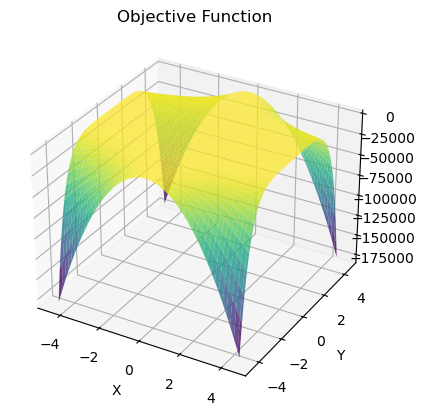

In [176]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Create the grid of input values
x_range = np.linspace(-4.5, 4.5, 100)
y_range = np.linspace(-4.5, 4.5, 100)
x_grid, y_grid = np.meshgrid(x_range, y_range)

# Evaluate function on grid
z_grid = benchmark(x_grid, y_grid)

# Create the plot
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.plot_surface(x_grid, y_grid, z_grid, cmap='viridis', alpha=0.8)

# Customize the plot
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_title('Objective Function')

# Show the plot
plt.show()

In [177]:
# Define the hyperparameter space
hyp_space  = [
    Integer(2, 10, name='num_layers'), # Num of layers in the network (depth)
    Integer(50, 200, name='num_units'), # Num of neurons in each hidden layer (width)
    Real(0.00001, 0.1, prior='log-uniform', name='learning_rate'), # Steps size at each iteration 
    Real(0.0, 0.5, name='dropout_rate'), # Probability of droping out a neuron
    Integer(20, 150, name='batch_size'), # Num of samples per batch
    Integer(50, 200, name='epochs') # Num of epochs (iterations over the entire dataset) during training
]

# Defining the Neural Network Model
def NN_model(num_layers, num_units, learning_rate, dropout_rate):
    inputs = Input(shape=(2,))
    x = Dense(num_units, activation='relu', kernel_regularizer='l2')(inputs)
    for _ in range(num_layers - 1):
        x = Dense(num_units, activation='relu', kernel_regularizer='l2')(x)
        x = Dropout(dropout_rate)(x)
    outputs = Dense(1, activation='linear')(x)
    model = Model(inputs=inputs, outputs=outputs)
    model.compile(optimizer=Adam(learning_rate=learning_rate), loss='mean_squared_error')
    return model

# Function for MC Dropout predictions
def mc_dropout_predictions(model, X, num_samples=50):
    predictions = np.zeros((num_samples, X.shape[0]))
    for i in range(num_samples):
        predictions[i, :] = model(X, training=True).numpy().flatten()
    prediction_mean = predictions.mean(axis=0)
    prediction_std = predictions.std(axis=0)
    return prediction_mean, prediction_std


In [178]:
# Define the known global maxima for the Himmelblau's function
global_maxima_points = [
    {"X": 3, "Y":  0.5, "Z": benchmark( 3,  0.5)},
]

# Create a DataFrame for the global maxima
global_maxima_df = pd.DataFrame(global_maxima_points)
global_maxima_df

,X,Y,Z
0,3,0.5,-0.0


In [ ]:
def perform_iteration(df):

    def sim_all(x):
        df["a"] = x[0,0]
        df["b"] = x[0,1]
        df["sim_z"] = sim_eval(df["x"], df["y"], df["a"], df["b"])
        df["diff"] = df["z"] - df["sim_z"]
        return (df["diff"]**2).sum()

    bo_domain = [{'name': 'a', 'type': 'continuous', 'domain': (-10,10)},
            {'name': 'b', 'type': 'continuous', 'domain': (-10,10)}]

    # Calibrate the sim model using physical tests so far, update df["a"] and df["b"] with calibrated parameters
    bo = BayesianOptimization(f=sim_all, domain=bo_domain, acquisition_type='EI')
    bo.run_optimization(max_iter=max_bo_iter)
    df["a"] = bo.x_opt[0]
    df["b"] = bo.x_opt[1]
    print(bo.x_opt)

    # Create the grid of input values
    x_range = np.linspace(-4.5, 4.5, 100)
    y_range = np.linspace(-4.5, 4.5, 100)
    x_grid, y_grid = np.meshgrid(x_range, y_range)
    sim_z_grid = sim_eval(x_grid, y_grid, bo.x_opt[0], bo.x_opt[1])

    # Create the plot
    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')
    ax.plot_surface(x_grid, y_grid, sim_z_grid, cmap='viridis', alpha=0.8)

    # Customize the plot
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_title('True Function with Simulation Calibrated Errors')

    # Show the plot
    plt.show()
    
    # Define the objective function to minimize
    @use_named_args(hyp_space)
    def objective(**params):
        num_layers = params['num_layers']
        num_units = params['num_units']
        learning_rate = params['learning_rate']
        dropout_rate = params['dropout_rate']
        batch_size = params['batch_size']
        epochs = params['epochs']

        model = NN_model(num_layers, num_units, learning_rate, dropout_rate)
    
        # Define K-fold cross-validation
        kfold = KFold(n_splits=5, shuffle=True, random_state=0)
        scores = []

        # Perform cross-validation
        for train_idx, val_idx in kfold.split(df[['x', 'y']]):
            X_train, X_val = df[['x', 'y']].iloc[train_idx], df[['x', 'y']].iloc[val_idx]
            y_train, y_val = df[['sim_z']].iloc[train_idx], df[['sim_z']].iloc[val_idx]

            # Standardize the features
            scaler_x = StandardScaler().fit(X_train)
            X_train_scaled = scaler_x.transform(X_train)
            X_val_scaled = scaler_x.transform(X_val)

            # Train the model
            model.fit(X_train_scaled, y_train, epochs=epochs, batch_size=batch_size, verbose=0, validation_data=(X_val_scaled, y_val))

            # Evaluate the model
            score = model.evaluate(X_val_scaled, y_val, verbose=0)
            scores.append(score)
    
        return np.mean(scores)

    # Perform Bayesian optimization
    result = gp_minimize(objective, hyp_space, n_calls=50, random_state=0, acq_func='EI')

    # Output best hyperparameters from BayesOpt
    print("Best hyperparameters:")
    print("num_layers:", result.x[0])
    print("num_units:", result.x[1])
    print("learning_rate:", result.x[2])
    print("dropout_rate:", result.x[3])
    print("batch_size:", result.x[4])
    print("epochs:", result.x[5])

    # Train the model with the best hyperparameters on the entire dataset
    best_model = NN_model(
        num_layers=result.x[0],
        num_units=result.x[1],
        learning_rate=result.x[2],
        dropout_rate=result.x[3]
    )

    x1_range = np.linspace(-4.5, 4.5, 100)
    x2_range = np.linspace(-4.5, 4.5, 100)
    bounds = np.array([[-4.5, 4.5], [-4.5, 4.5]])  # Bounds for x1 and x2

    # Generate 15 points using Latin Hypercube Sampling (LHS)
    n_samples = 15
    lhs= qmc.LatinHypercube(d=2, optimization="random-cd")
    lhs_samples = lhs.random(n=n_samples)

    scaled_samples = qmc.scale(lhs_samples, bounds[:, 0], bounds[:, 1])

    selected_points_df = pd.DataFrame(scaled_samples, columns=['x', 'y'])
    selected_points_df['sim_z'] = sim_eval(selected_points_df['x'], selected_points_df['y'], bo.x_opt[0], bo.x_opt[1])

    sim_df = df[["x", "y", "sim_z"]]
    sim_df = pd.concat([sim_df, selected_points_df], axis=0, ignore_index=True)


    # Standardize the combined datasets
    scaler_x = StandardScaler().fit(sim_df[['x', 'y']])
    X_scaled = scaler_x.transform(sim_df[['x', 'y']])

    # Train the best model on the combined standardized dataset
    best_model.fit(X_scaled, sim_df[['sim_z']], epochs=result.x[5], batch_size=result.x[4], verbose=1)

    # Produce Meshgrid of results with C.I. 
    #pred_mean, pred_std = mc_dropout_predictions(best_model, X_scaled)

    # Create a meshgrid and combine into a single array
    x1_grid, x2_grid = np.meshgrid(x1_range, x2_range)
    x_grid = np.c_[x1_grid.ravel(), x2_grid.ravel()]

    # Perform MC Dropout predictions on the entire grid
    pred_mean, pred_std = mc_dropout_predictions(best_model, x_grid)

    # Ploting mean predictions and confidence intervals
    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')

    # Reshaping predictions back to grid shape
    pred_mean_grid = pred_mean.reshape(x1_grid.shape)
    pred_upper_grid = (pred_mean + (1.96 * pred_std)).reshape(x1_grid.shape)
    pred_lower_grid = (pred_mean - (1.96 * pred_std)).reshape(x1_grid.shape)

    mean_surface = ax.plot_surface(x1_grid, x2_grid, pred_mean_grid, color='blue', alpha=0.5, label='Mean Prediction')
    upper_surface = ax.plot_surface(x1_grid, x2_grid, pred_upper_grid, color='red', alpha=0.3, label='Upper Bound (95% CI)')
    lower_surface = ax.plot_surface(x1_grid, x2_grid, pred_lower_grid, color='green', alpha=0.3, label='Lower Bound (95% CI)')

    # Plot next candidate points
    ax.scatter(selected_points_df['x'], selected_points_df['y'], selected_points_df['z'], color='black', marker='o', label='Next Sampling Points')

    # Customize the plot
    ax.set_title('Neural Network of Simulated Sampled Points with Confidence Intervals')
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Output')

    # Legend
    legend_elements = [mean_surface, upper_surface, lower_surface]
    fig.legend(handles=legend_elements, loc='upper left', bbox_to_anchor=(0.1, 0.9))

    # Show the plot
    plt.show()


    # Generate predictions for the heatmap
    pred_mean_grid = pred_mean.reshape(x1_grid.shape)

    # Plot the heatmap
    plt.figure(figsize=(10, 8))
    heatmap = plt.contourf(x1_grid, x2_grid, pred_mean_grid, cmap='viridis', levels=50)
    plt.colorbar(heatmap, label="Neural Network Response")

    # Overlay sampled points
    plt.scatter(sim_df['x'], sim_df['y'], color='white', edgecolor='black', label='Simulation Sampled Points')

    # Customize the plot
    plt.title("Heatmap of Neural Network Response with Simulation Points")
    plt.xlabel("X1")
    plt.ylabel("X2")
    plt.legend()
    plt.show()

    x_grid_2 = sim_df[['x','y']].to_numpy()
    new_mean, new_std = mc_dropout_predictions(best_model, x_grid_2)

    temp_df = pd.DataFrame(scaled_samples, columns=['x','y'])
    temp_df['pred_mean'] = new_mean
    temp_df['uncerrtainty'] = new_std

    from skopt.space import Space

    space = Space([(df["x"].min(), df["x"].max()), 
               (df["y"].min(), df["y"].max())])
    
    beta = 2.5  # Controls exploration vs. exploitation

    def acquisition_function(x):
        """ UCB Acquisition Function: Maximizes Mean + beta * Uncertainty """
        x1, x2 = x
        point = df[(df["x"] == x1) & (df["y"] == x2)]
        if len(point) > 0:
            return - (point["pred_mean"].values[0] + beta * point["uncertainty"].values[0])
        else:
            return 0  # Default value if point not in dataset
        
    res = gp_minimize(acquisition_function, space.dimensions, n_calls=10, n_random_starts=5, acq_func="LCB", kappa=beta)

    selected_points = np.array(res.x_iters)[:5]  # Select 5 best points

    physical_test_points = pd.DataFrame(selected_points, columns=["x", "y"])

    # Generate predictions for the heatmap
    new_mean_grid = new_mean.reshape(x1_grid.shape)

    # Plot the heatmap
    plt.figure(figsize=(10, 8))
    heatmap = plt.contourf(x1_grid, x2_grid, new_mean_grid, cmap='viridis', levels=50)
    plt.colorbar(heatmap, label="Neural Network Response of Simulated Points")

    # Overlay sampled points
    plt.scatter(physical_test_points['x'], physical_test_points['y'], color='white', edgecolor='black', label='Next Physical Sample Points')

    # Customize the plot
    plt.title("Heatmap of Neural Network Response with Simulation Points")
    plt.xlabel("X1")
    plt.ylabel("X2")
    plt.legend()
    plt.show()

    # Add validated data points to original data frame
    physical_test_points["z"] = benchmark(physical_test_points['x'], physical_test_points['y']) + ran_err(15, 0.05)
    physical_test_points["a"] = bo.x_opt[0]
    physical_test_points["b"] = bo.x_opt[1]
    physical_test_points["sim_z"] = sim_eval(physical_test_points["x"], physical_test_points["y"], physical_test_points["a"], physical_test_points["b"])
    physical_test_points["diff"] = physical_test_points["z"] - physical_test_points["sim_z"]

    # Heatmap of Simulated Points 
    fig, ax = plt.subplots(figsize=(10, 8))

    # Plot the heatmap for sim_z_grid
    heatmap = ax.contourf(x_grid, y_grid, sim_z_grid, levels=100, cmap='viridis', alpha=0.8)

    # Overlay scatter points for sampling points
    ax.scatter(df["x"], df["y"], color='blue', marker='o', label='Previous Sampled Points')
    ax.scatter(sim_df["x"], sim_df["y"], color='black', marker='o', label='Sampled Simulation Points')
    ax.scatter(physical_test_points["x"], physical_test_points["y"], color='purple', marker='o', label='Sampled Simulation Points')

    # Overlay scatter points for global maxima
    ax.scatter(global_maxima_df['X'], global_maxima_df['Y'], color='red', marker='o', label='Global Maximum Points')

    # Customize the plot
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_title('True Function with Simulation Calibrated Errors (Heatmap)')
    ax.legend()

    # Add a color bar
    cbar = plt.colorbar(heatmap, ax=ax)
    cbar.set_label('Function Value (Z)')

    # Show the plot
    plt.show()


    df = pd.concat([df, physical_test_points], axis=0, ignore_index=True)


    return df


[ 4.4746519 -3.0244002]


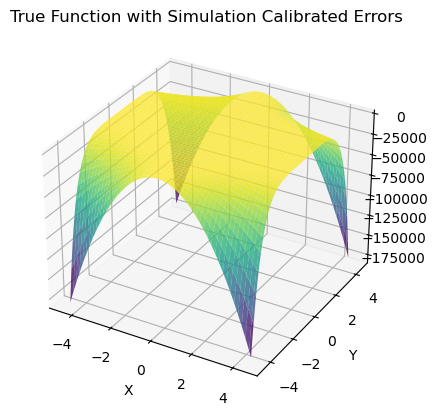

Best hyperparameters:
num_layers: 10
num_units: 200
learning_rate: 0.0008655837778444891
dropout_rate: 0.10743266591501803
batch_size: 20
epochs: 145
Epoch 1/145
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step - loss: 69361824.0000
Epoch 2/145
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step - loss: 69361288.0000
Epoch 3/145
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 69360664.0000
Epoch 4/145
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 69359056.0000
Epoch 5/145
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 69357120.0000
Epoch 6/145
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 69353888.0000
Epoch 7/145
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 69347816.0000
Epoch 8/145
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 69337984.0000
Epoch 9/145
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 69318840.0000
Epoch 10/145
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 69290744.0000
Epoch 11/145
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 69246344.0000
Epoch 12/145
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss:

KeyError: 'z'

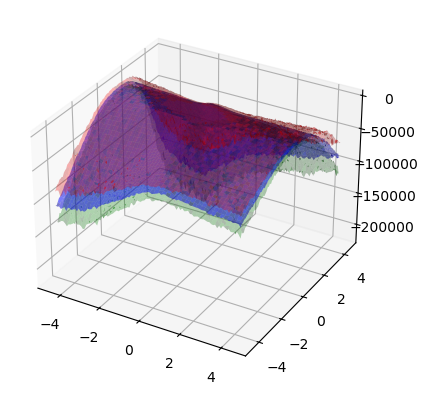

In [183]:
df = perform_iteration(df)
print(df)


In [ ]:
df = perform_iteration(df)

KeyboardInterrupt: 

In [ ]:
df = df.iloc[:, :-4]
df

,x,y,z
0,-0.746802,-3.668953,-1695.133401
1,1.982920,-2.823658,-2231.461373
2,-4.498971,-1.389953,-522.757847
3,-1.779007,-0.929093,-64.660164
4,-3.179197,0.349351,-70.191649
5,1.024335,0.300421,-5.021471
6,1.856884,0.742355,-5.386866
7,-0.470518,1.479292,-7.027878
8,0.338582,-1.399534,-9.012765
9,-1.311022,1.042701,-12.671589


In [ ]:
from GPyOpt.methods import BayesianOptimization

def sim_all(x):
    df["a"] = x[0,0]
    df["b"] = x[0,1]
    df["sim_z"] = sim_eval(df["x"], df["y"], df["a"], df["b"])
    df["diff"] = df["z"] - df["sim_z"]
    return (df["diff"]**2).sum()

bo_domain = [{'name': 'a', 'type': 'continuous', 'domain': (-10,10)},
          {'name': 'b', 'type': 'continuous', 'domain': (-10,10)}]

# Calibrate the sim model using physical tests so far, update df["a"] and df["b"] with calibrated parameters
bo = BayesianOptimization(f=sim_all, domain=bo_domain, acquisition_type='EI')
bo.run_optimization(max_iter=max_bo_iter)
df["a"] = bo.x_opt[0]
df["b"] = bo.x_opt[1]
print(bo.x_opt)



[ 4.22410963 -3.04116051]


In [ ]:
# Define the known global maxima for the Himmelblau's function
global_maxima_points = [
    {"X": 3, "Y":  0.5, "Z": benchmark( 3,  0.5)},
]

# Create a DataFrame for the global maxima
global_maxima_df = pd.DataFrame(global_maxima_points)
global_maxima_df

,X,Y,Z
0,3,0.5,-0.0


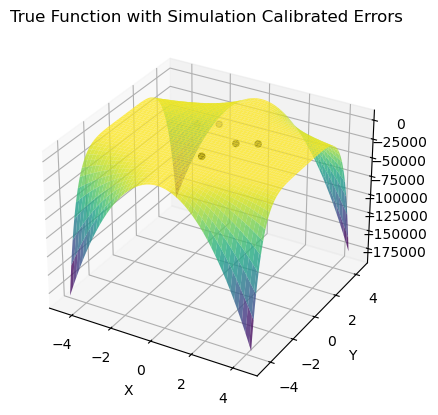

In [ ]:
sim_z_grid = sim_eval(x_grid, y_grid, bo.x_opt[0], bo.x_opt[1])

# Create the plot
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.scatter(df_new["x"], df_new["y"], df_new["sim_z"], color='black', marker='o', label='Next Sampling Points')
ax.plot_surface(x_grid, y_grid, sim_z_grid, cmap='viridis', alpha=0.8)



# Customize the plot
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_title('True Function with Simulation Calibrated Errors')

# Show the plot
plt.show()

In [ ]:
new_entry1 = pd.DataFrame({"Highest_phy_Response": [df_new['z'].max()],
                          "Round_num": [1]})
round_val_df = pd.concat([round_val_df, new_entry1], ignore_index=True)

In [ ]:
df

,x,y,z,a,b,sim_z,diff
0,-0.746802,-3.668953,-1695.133401,4.22411,-3.041161,-1695.127130,-0.006271
1,1.982920,-2.823658,-2231.461373,4.22411,-3.041161,-2231.676983,0.215610
2,-4.498971,-1.389953,-522.757847,4.22411,-3.041161,-522.524012,-0.233835
3,-1.779007,-0.929093,-64.660164,4.22411,-3.041161,-64.489118,-0.171046
4,-3.179197,0.349351,-70.191649,4.22411,-3.041161,-70.296529,0.104880
5,1.024335,0.300421,-5.021471,4.22411,-3.041161,-5.022740,0.001269
6,1.856884,0.742355,-5.386866,4.22411,-3.041161,-5.383082,-0.003784
7,-0.470518,1.479292,-7.027878,4.22411,-3.041161,-6.997780,-0.030098
8,0.338582,-1.399534,-9.012765,4.22411,-3.041161,-8.989718,-0.023047
9,-1.311022,1.042701,-12.671589,4.22411,-3.041161,-12.695481,0.023892


In [ ]:
# Assuming df is your DataFrame
average1 = df.iloc[:, -1].mean()

print("Average of the last column:", average1)

Average of the last column: -0.012243059120512444


In [ ]:
# New DataFrame with the first 5 data points
df_original = df.iloc[:5]

print(df_original)

          x         y            z        a         b        sim_z      diff
0 -0.746802 -3.668953 -1695.133401  4.22411 -3.041161 -1695.127130 -0.006271
1  1.982920 -2.823658 -2231.461373  4.22411 -3.041161 -2231.676983  0.215610
2 -4.498971 -1.389953  -522.757847  4.22411 -3.041161  -522.524012 -0.233835
3 -1.779007 -0.929093   -64.660164  4.22411 -3.041161   -64.489118 -0.171046
4 -3.179197  0.349351   -70.191649  4.22411 -3.041161   -70.296529  0.104880


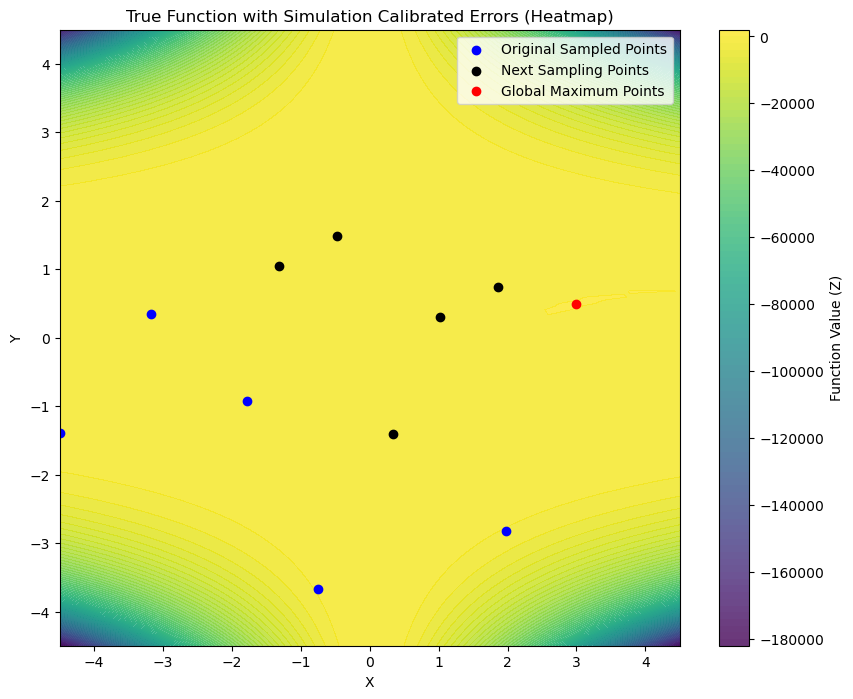

In [ ]:
# Create the heatmap plot
fig, ax = plt.subplots(figsize=(10, 8))

# Plot the heatmap for sim_z_grid
heatmap = ax.contourf(x_grid, y_grid, sim_z_grid, levels=100, cmap='viridis', alpha=0.8)

# Overlay scatter points for sampling points
ax.scatter(df_original["x"], df_original["y"], color='blue', marker='o', label='Original Sampled Points')
ax.scatter(df_new["x"], df_new["y"], color='black', marker='o', label='Next Sampling Points')

# Overlay scatter points for global maxima
ax.scatter(global_maxima_df['X'], global_maxima_df['Y'], color='red', marker='o', label='Global Maximum Points')

# Customize the plot
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_title('True Function with Simulation Calibrated Errors (Heatmap)')
ax.legend()

# Add a color bar
cbar = plt.colorbar(heatmap, ax=ax)
cbar.set_label('Function Value (Z)')

# Show the plot
plt.show()

In [ ]:
df_new2 = pd.DataFrame

df_sim = df.copy()

Best hyperparameters:
num_layers: 2
num_units: 138
learning_rate: 0.001500383371433453
dropout_rate: 0.0
batch_size: 150
epochs: 121
Epoch 1/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 817ms/step - loss: 813571.8125
Epoch 2/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 813400.6250
Epoch 3/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 813231.5000
Epoch 4/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 813067.8125
Epoch 5/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 812907.6250
Epoch 6/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 812744.1250
Epoch 7/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 812581.0000
Epoch 8/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 812414.4375
Epoch 9/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step - loss: 812238.1875
Epoch 10/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 812053.3125
Epoch 11/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 811857.7500
Epoch 12/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step - loss: 811650.5625
Epoch 13/200
1/1 ━━━━━━

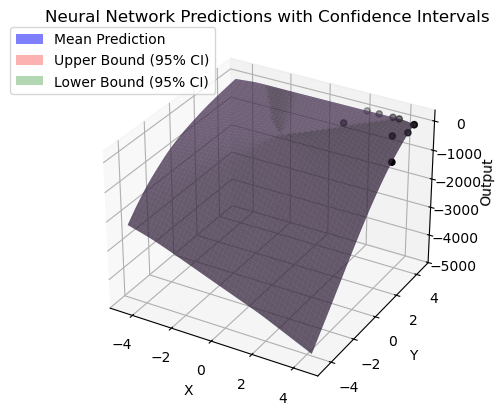

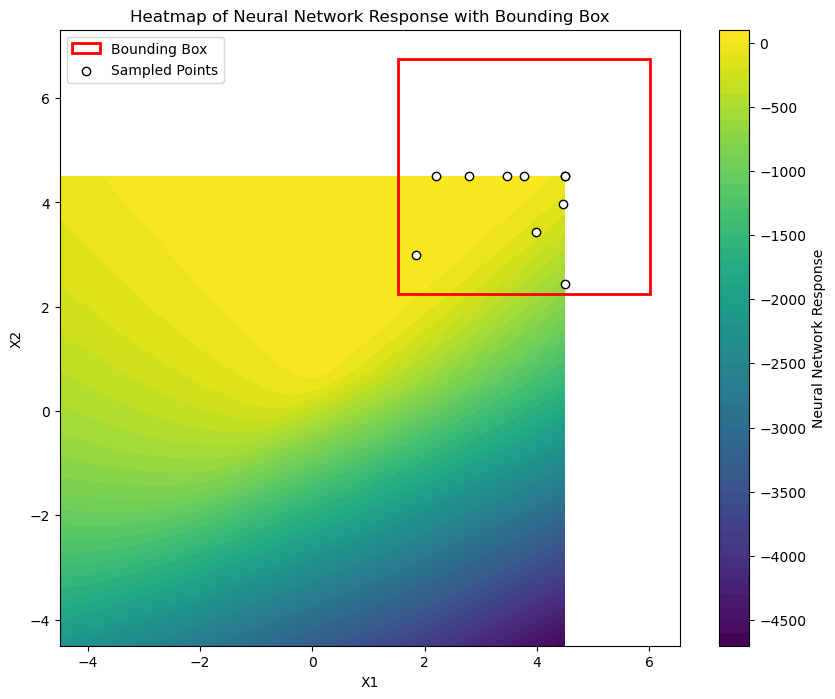

In [ ]:
df_sim, df_new2 = perform_iteration(df_sim, df)

Best hyperparameters:
num_layers: 9
num_units: 200
learning_rate: 0.005286126472389941
dropout_rate: 0.0
batch_size: 20
epochs: 200
Epoch 1/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step - loss: 7710749184.0000
Epoch 2/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 7710655488.0000
Epoch 3/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 7709766656.0000
Epoch 4/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 7704750080.0000
Epoch 5/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 7682182144.0000
Epoch 6/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 7597800448.0000
Epoch 7/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 7327621632.0000
Epoch 8/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 6582245888.0000
Epoch 9/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 4899745280.0000
Epoch 10/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 2769836800.0000
Epoch 11/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 11077383168.0000
Epoch 12/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - 

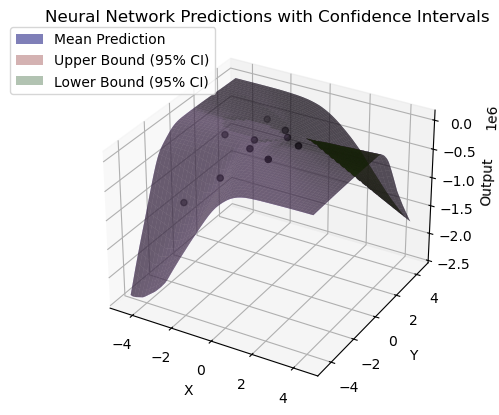

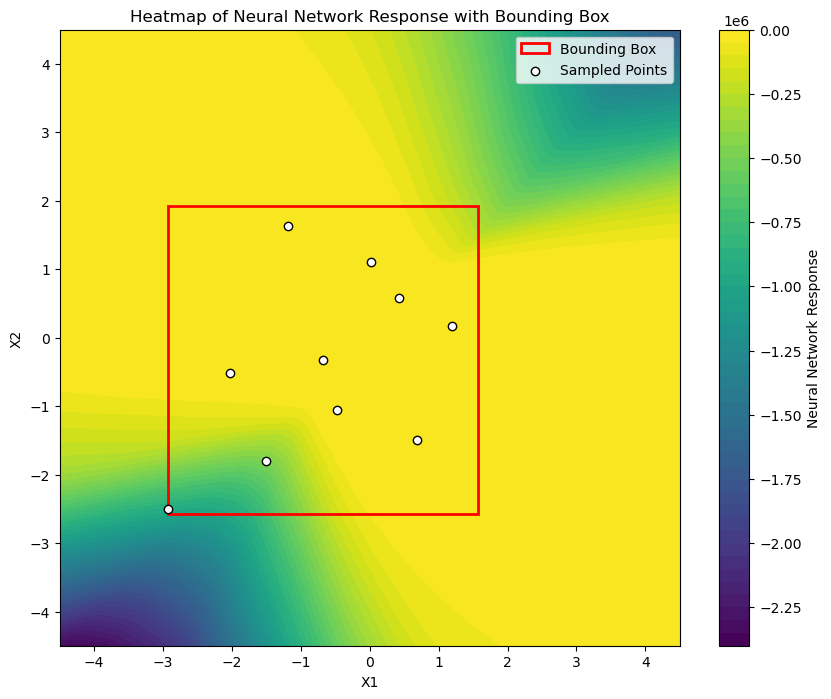

In [ ]:
df_sim, df_new2 = perform_iteration(df_sim, df)

Best hyperparameters:
num_layers: 7
num_units: 200
learning_rate: 0.004589412926249416
dropout_rate: 0.0
batch_size: 150
epochs: 141
Epoch 1/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 5783276544.0000
Epoch 2/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 5783223296.0000
Epoch 3/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 5782975488.0000
Epoch 4/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 5782121472.0000
Epoch 5/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 5779503104.0000
Epoch 6/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 5772428288.0000
Epoch 7/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 5755089920.0000
Epoch 8/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 5715984896.0000
Epoch 9/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 5634239488.0000
Epoch 10/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 5474028544.0000
Epoch 11/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 5179143168.0000
Epoch 12/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - 

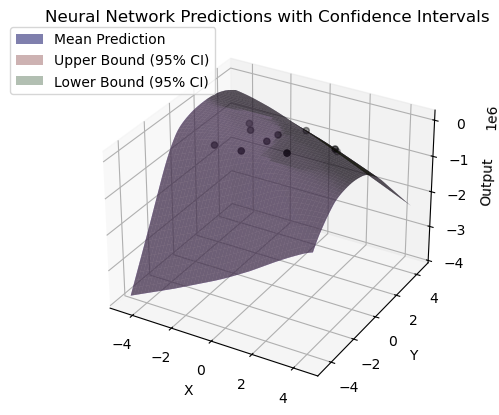

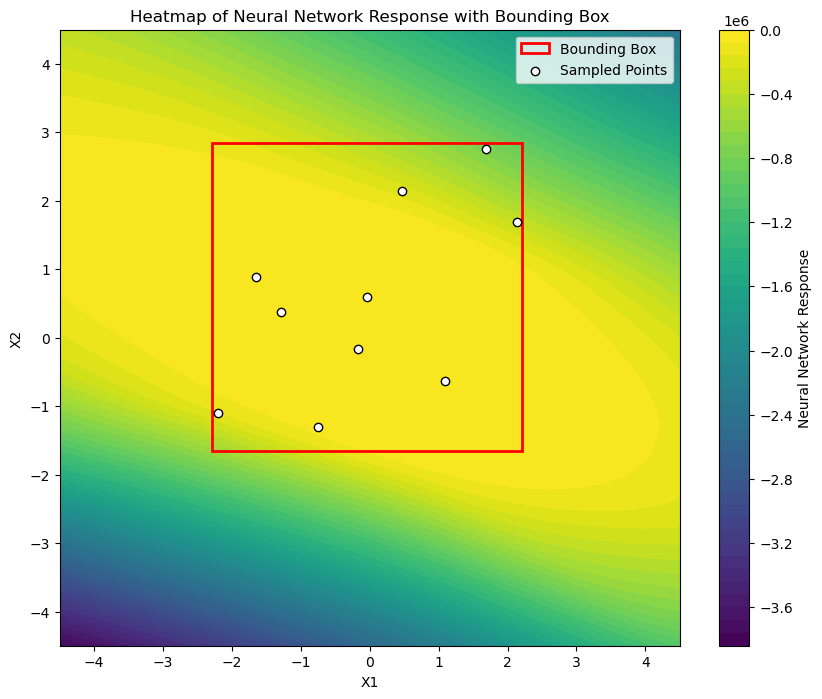

In [ ]:
df_sim, df_new2 = perform_iteration(df_sim, df)

Best hyperparameters:
num_layers: 9
num_units: 200
learning_rate: 0.001621978627827528
dropout_rate: 0.0
batch_size: 150
epochs: 200
Epoch 1/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step - loss: 4626665984.0000
Epoch 2/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 4626655232.0000
Epoch 3/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 4626630656.0000
Epoch 4/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 4626575360.0000
Epoch 5/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 4626457600.0000
Epoch 6/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 4626223104.0000
Epoch 7/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 4625768960.0000
Epoch 8/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 4624915968.0000
Epoch 9/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 4623361536.0000
Epoch 10/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 4620577792.0000
Epoch 11/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 4615673856.0000
Epoch 12/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - 

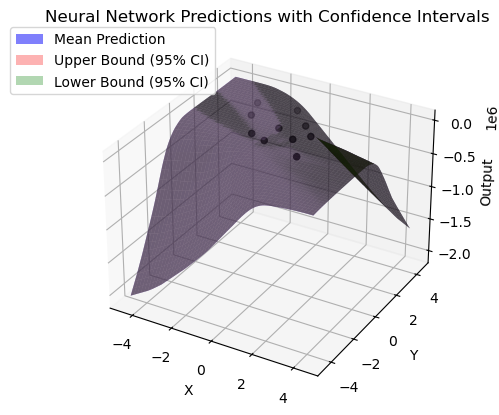

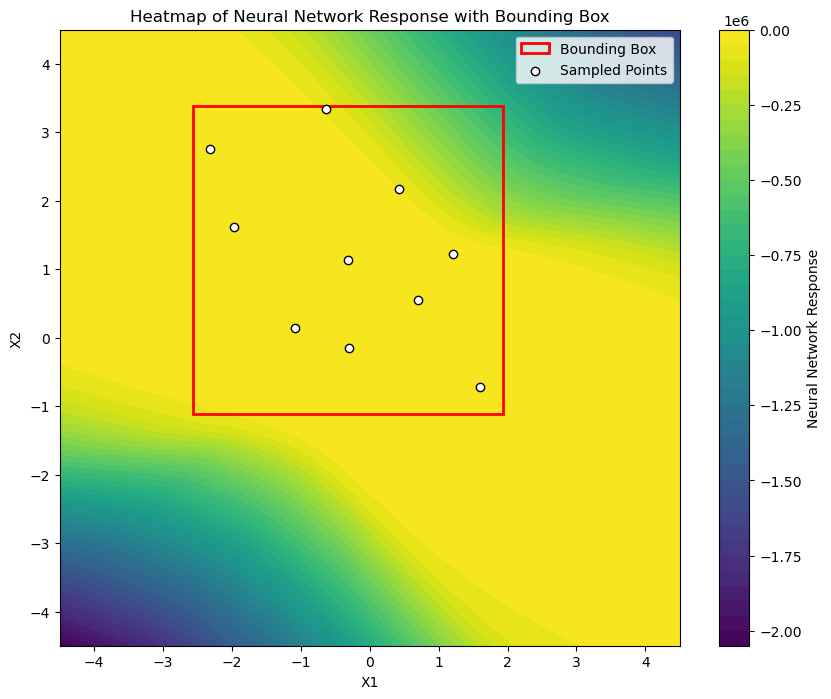

In [ ]:
df_sim, df_new2 = perform_iteration(df_sim, df)

Best hyperparameters:
num_layers: 7
num_units: 200
learning_rate: 0.0032106335960266777
dropout_rate: 0.0
batch_size: 150
epochs: 200
Epoch 1/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 3855631872.0000
Epoch 2/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 3855610624.0000
Epoch 3/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 3855538432.0000
Epoch 4/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 3855339776.0000
Epoch 5/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 3854845440.0000
Epoch 6/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - loss: 3853691136.0000
Epoch 7/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 3851180544.0000
Epoch 8/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 3846026496.0000
Epoch 9/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 3835959808.0000
Epoch 10/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 3817059840.0000
Epoch 11/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 3783061760.0000
Epoch 12/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step -

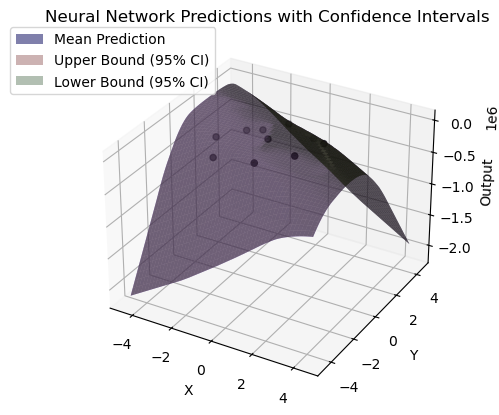

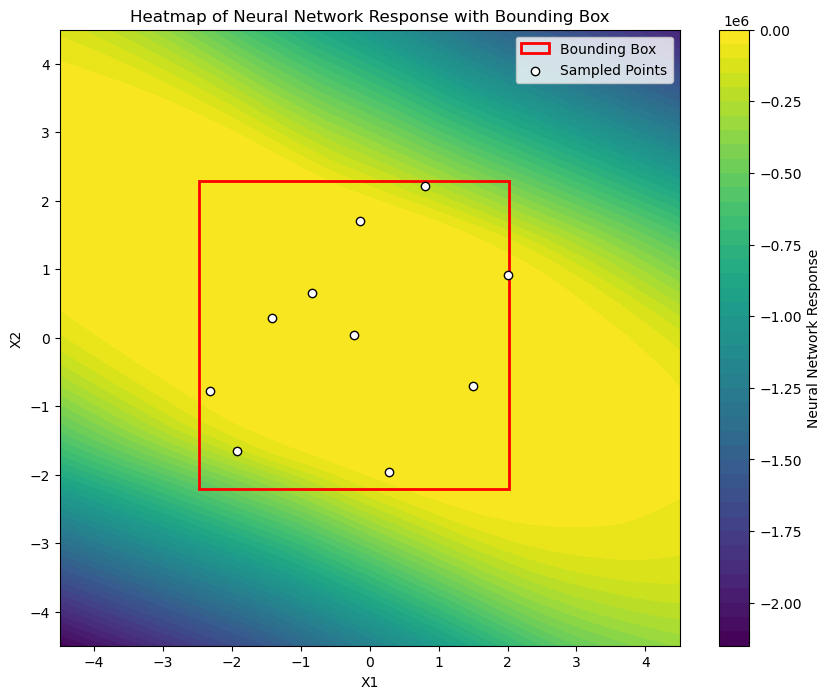

In [ ]:
df_sim, df_new2 = perform_iteration(df_sim, df)

Best hyperparameters:
num_layers: 7
num_units: 200
learning_rate: 0.0024253148852232355
dropout_rate: 0.0
batch_size: 55
epochs: 200
Epoch 1/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 3304826880.0000
Epoch 2/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 3304808448.0000
Epoch 3/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 3304760832.0000
Epoch 4/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 3304651776.0000
Epoch 5/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 3304412160.0000
Epoch 6/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 3303917312.0000
Epoch 7/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 3302938112.0000
Epoch 8/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 3301070080.0000
Epoch 9/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 3297671168.0000
Epoch 10/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 3291691776.0000
Epoch 11/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 3281467648.0000
Epoch 12/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - 

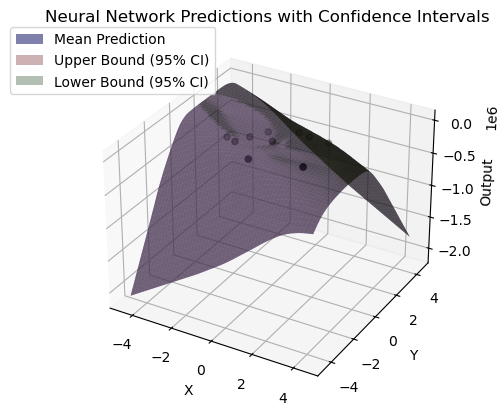

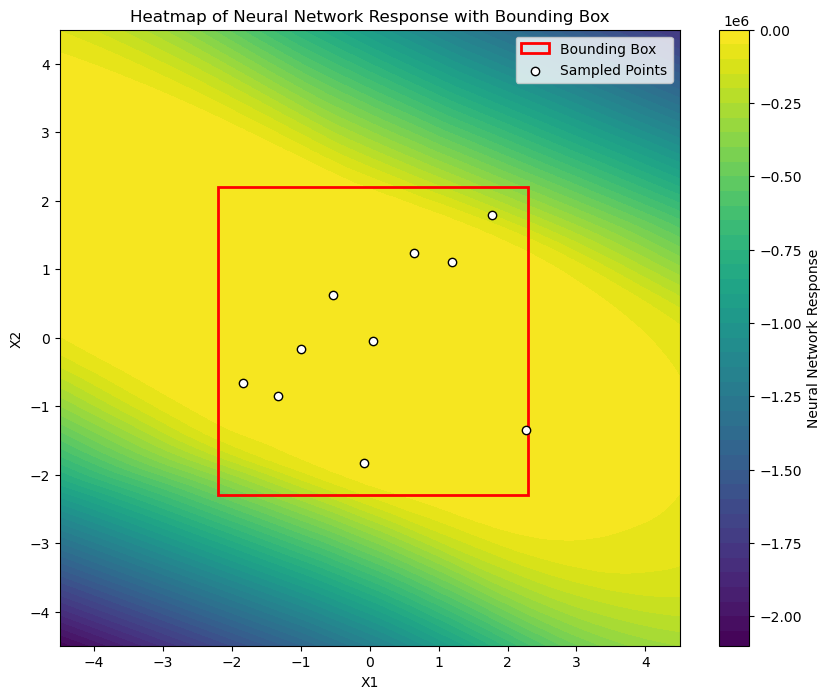

In [ ]:
df_sim, df_new2 = perform_iteration(df_sim, df)

Best hyperparameters:
num_layers: 9
num_units: 200
learning_rate: 0.003545874681194023
dropout_rate: 0.0
batch_size: 150
epochs: 200
Epoch 1/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step - loss: 2891724288.0000
Epoch 2/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 2891703808.0000
Epoch 3/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 2891575296.0000
Epoch 4/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 2891064832.0000
Epoch 5/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 2889345536.0000
Epoch 6/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 2884202496.0000
Epoch 7/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 2870087936.0000
Epoch 8/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 2834389760.0000
Epoch 9/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 2751277824.0000
Epoch 10/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 2572765184.0000
Epoch 11/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 2230222080.0000
Epoch 12/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - 

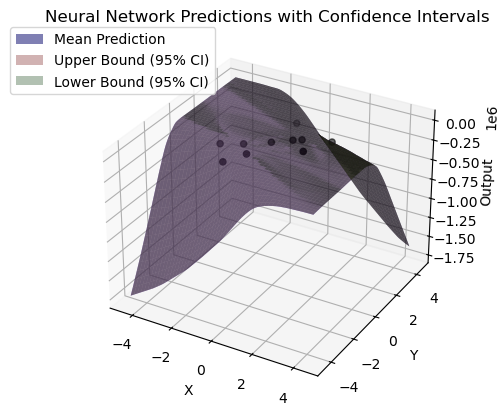

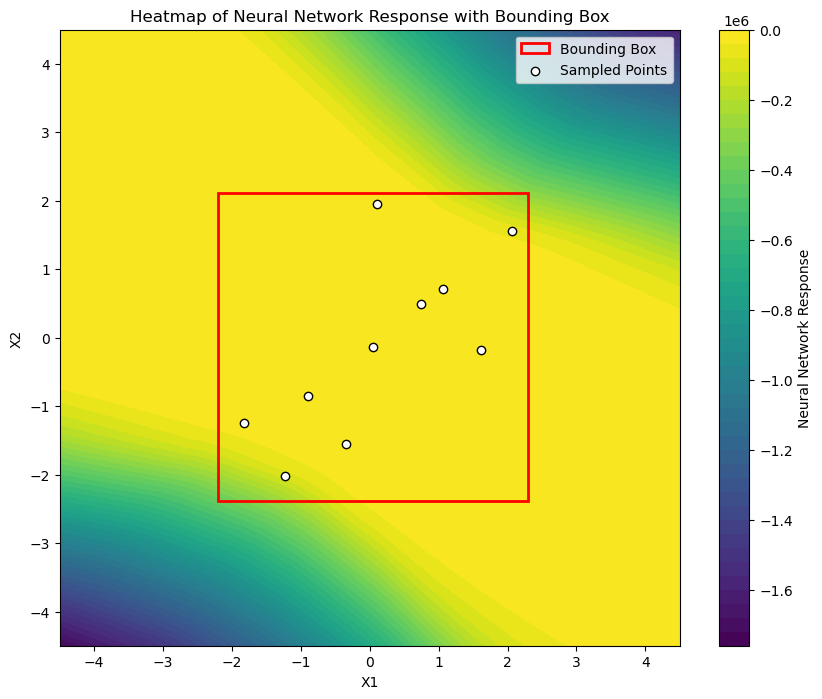

In [ ]:
df_sim, df_new2 = perform_iteration(df_sim, df)

Best hyperparameters:
num_layers: 10
num_units: 68
learning_rate: 0.0043985055817423735
dropout_rate: 0.0
batch_size: 150
epochs: 200
Epoch 1/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step - loss: 2570422528.0000
Epoch 2/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 2570416640.0000
Epoch 3/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 2570401024.0000
Epoch 4/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 2570366208.0000
Epoch 5/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 2570290432.0000
Epoch 6/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 2570131456.0000
Epoch 7/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 2569815808.0000
Epoch 8/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 2569193728.0000
Epoch 9/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 2568002048.0000
Epoch 10/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 2565749760.0000
Epoch 11/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 2561597184.0000
Epoch 12/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step -

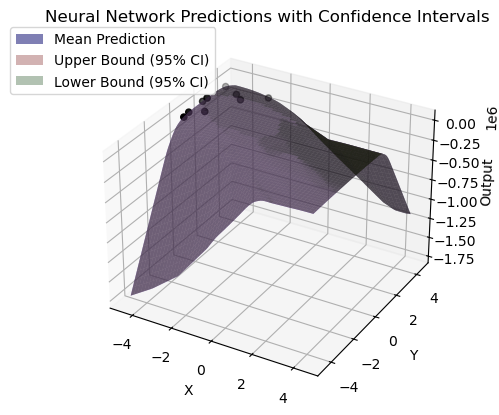

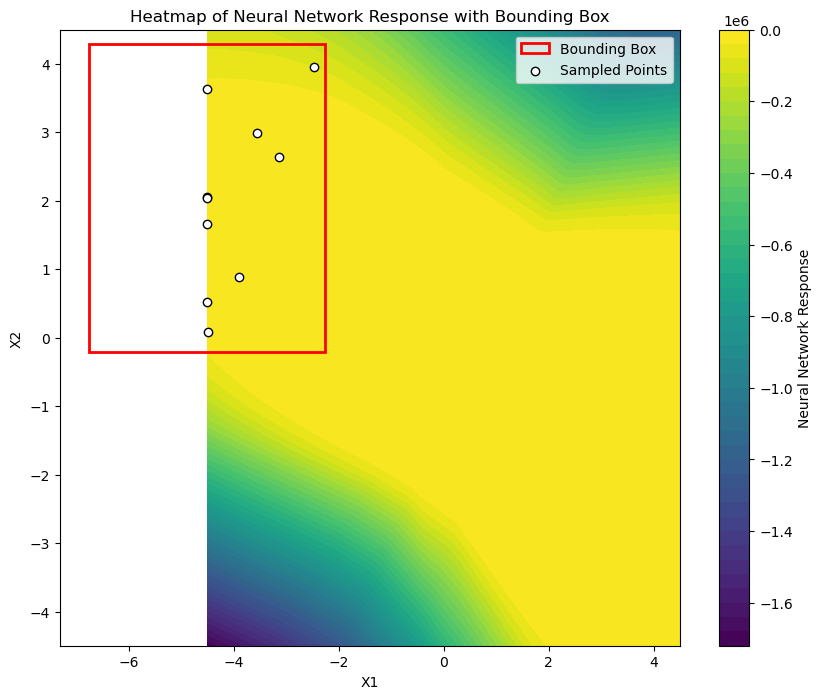

In [ ]:
df_sim, df_new2 = perform_iteration(df_sim, df)

Best hyperparameters:
num_layers: 7
num_units: 200
learning_rate: 0.0008276967071850583
dropout_rate: 0.0
batch_size: 20
epochs: 200
Epoch 1/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step - loss: 2341020672.0000
Epoch 2/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 2341015808.0000
Epoch 3/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 2341010176.0000
Epoch 4/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 2341002752.0000
Epoch 5/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 2340991744.0000
Epoch 6/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - loss: 2340976128.0000
Epoch 7/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 2340954880.0000
Epoch 8/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 2340924672.0000
Epoch 9/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 2340883456.0000
Epoch 10/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - loss: 2340825600.0000
Epoch 11/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 2340746496.0000
Epoch 12/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - 

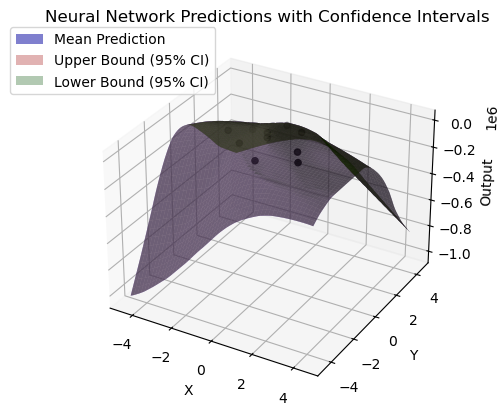

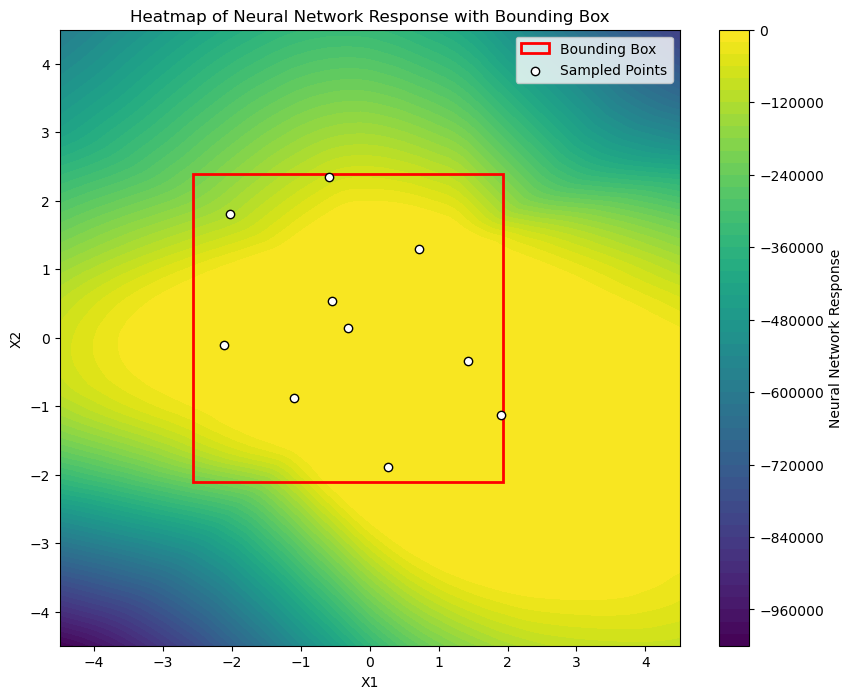

In [ ]:
df_sim, df_new2 = perform_iteration(df_sim, df)

Best hyperparameters:
num_layers: 10
num_units: 200
learning_rate: 0.003934299999649745
dropout_rate: 0.0
batch_size: 20
epochs: 126
Epoch 1/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step - loss: 2128201472.0000
Epoch 2/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 2128196224.0000
Epoch 3/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 2128158336.0000
Epoch 4/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 2127976576.0000
Epoch 5/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 2127238400.0000
Epoch 6/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 2124535680.0000
Epoch 7/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 2115615488.0000
Epoch 8/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 2088809856.0000
Epoch 9/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 2015940864.0000
Epoch 10/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 1839288576.0000
Epoch 11/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 1491858560.0000
Epoch 12/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - 

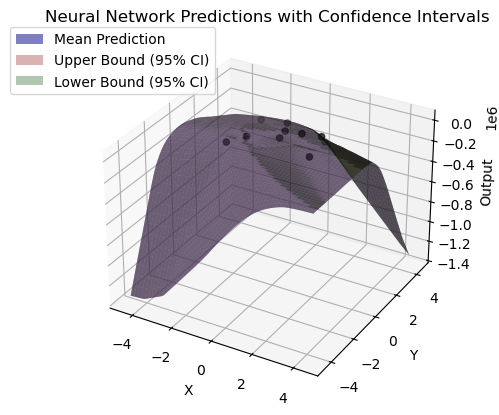

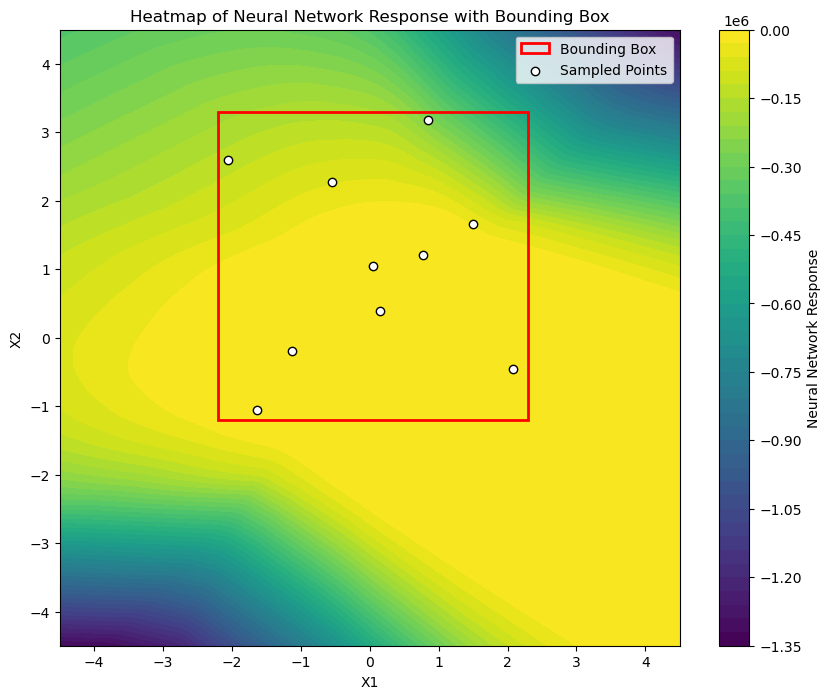

In [ ]:
df_sim, df_new2 = perform_iteration(df_sim, df)

In [ ]:
df_new2

,x,y,z,a,b,sim_z,diff
5,2.071785,-0.458208,-2.845895,4.22411,-3.041161,-2.795794,-0.050101
8,-0.541568,2.275329,-11.005763,4.22411,-3.041161,-11.036052,0.030289
4,0.152367,0.383514,-12.636300,4.22411,-3.041161,-12.621566,-0.014734
9,0.045455,1.045455,-14.363957,4.22411,-3.041161,-14.260580,-0.103377
7,0.776144,1.210750,-20.037763,4.22411,-3.041161,-19.953444,-0.084319


In [ ]:
df

,x,y,z,a,b,sim_z,diff
0,-0.746802,-3.668953,-1695.133401,4.22411,-3.041161,-1695.127130,-0.006271
1,1.982920,-2.823658,-2231.461373,4.22411,-3.041161,-2231.676983,0.215610
2,-4.498971,-1.389953,-522.757847,4.22411,-3.041161,-522.524012,-0.233835
3,-1.779007,-0.929093,-64.660164,4.22411,-3.041161,-64.489118,-0.171046
4,-3.179197,0.349351,-70.191649,4.22411,-3.041161,-70.296529,0.104880
5,1.024335,0.300421,-5.021471,4.22411,-3.041161,-5.022740,0.001269
6,1.856884,0.742355,-5.386866,4.22411,-3.041161,-5.383082,-0.003784
7,-0.470518,1.479292,-7.027878,4.22411,-3.041161,-6.997780,-0.030098
8,0.338582,-1.399534,-9.012765,4.22411,-3.041161,-8.989718,-0.023047
9,-1.311022,1.042701,-12.671589,4.22411,-3.041161,-12.695481,0.023892


In [ ]:
df = pd.concat([df, df_new2], ignore_index=True)
df

,x,y,z,a,b,sim_z,diff
0,-0.746802,-3.668953,-1695.133401,4.22411,-3.041161,-1695.127130,-0.006271
1,1.982920,-2.823658,-2231.461373,4.22411,-3.041161,-2231.676983,0.215610
2,-4.498971,-1.389953,-522.757847,4.22411,-3.041161,-522.524012,-0.233835
3,-1.779007,-0.929093,-64.660164,4.22411,-3.041161,-64.489118,-0.171046
4,-3.179197,0.349351,-70.191649,4.22411,-3.041161,-70.296529,0.104880
5,1.024335,0.300421,-5.021471,4.22411,-3.041161,-5.022740,0.001269
6,1.856884,0.742355,-5.386866,4.22411,-3.041161,-5.383082,-0.003784
7,-0.470518,1.479292,-7.027878,4.22411,-3.041161,-6.997780,-0.030098
8,0.338582,-1.399534,-9.012765,4.22411,-3.041161,-8.989718,-0.023047
9,-1.311022,1.042701,-12.671589,4.22411,-3.041161,-12.695481,0.023892


In [ ]:
df = df.iloc[:, :-4]
df

,x,y,z
0,-0.746802,-3.668953,-1695.133401
1,1.982920,-2.823658,-2231.461373
2,-4.498971,-1.389953,-522.757847
3,-1.779007,-0.929093,-64.660164
4,-3.179197,0.349351,-70.191649
5,1.024335,0.300421,-5.021471
6,1.856884,0.742355,-5.386866
7,-0.470518,1.479292,-7.027878
8,0.338582,-1.399534,-9.012765
9,-1.311022,1.042701,-12.671589


In [ ]:
new_entry1 = pd.DataFrame({"Highest_phy_Response": [df_new2['z'].max()],
                          "Round_num": [2]})
round_val_df = pd.concat([round_val_df, new_entry1], ignore_index=True)

In [ ]:
from GPyOpt.methods import BayesianOptimization

def sim_all(x):
    df["a"] = x[0,0]
    df["b"] = x[0,1]
    df["sim_z"] = sim_eval(df["x"], df["y"], df["a"], df["b"])
    df["diff"] = df["z"] - df["sim_z"]
    return (df["diff"]**2).sum()

bo_domain = [{'name': 'a', 'type': 'continuous', 'domain': (-10,10)},
          {'name': 'b', 'type': 'continuous', 'domain': (-10,10)}]

# Calibrate the sim model using physical tests so far, update df["a"] and df["b"] with calibrated parameters
bo = BayesianOptimization(f=sim_all, domain=bo_domain, acquisition_type='EI')
bo.run_optimization(max_iter=max_bo_iter)
df["a"] = bo.x_opt[0]
df["b"] = bo.x_opt[1]
print(bo.x_opt)

[ 4.15105342 -2.97578332]


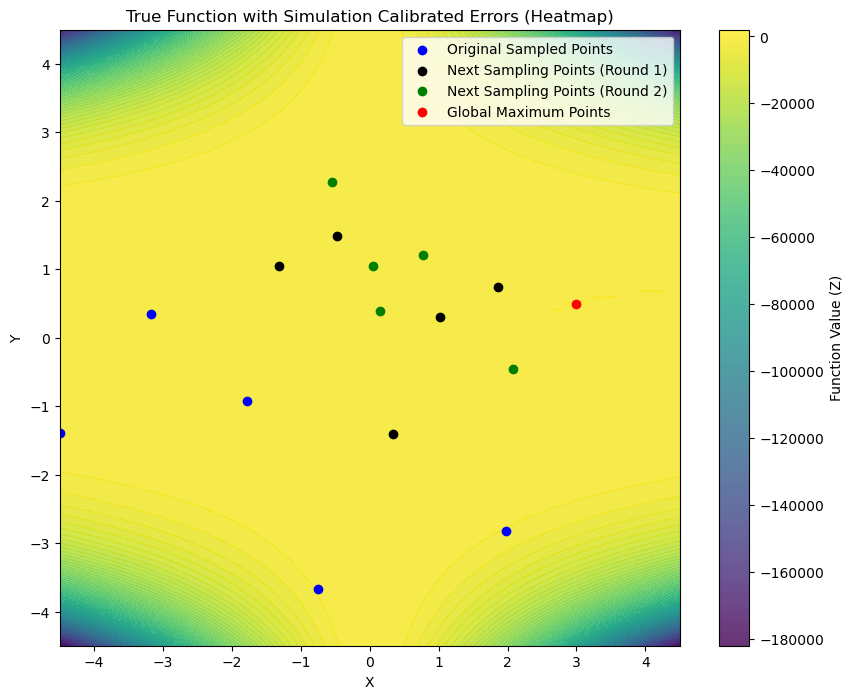

In [ ]:
# Create the heatmap plot
fig, ax = plt.subplots(figsize=(10, 8))

# Plot the heatmap for sim_z_grid
heatmap = ax.contourf(x_grid, y_grid, sim_z_grid, levels=100, cmap='viridis', alpha=0.8)

# Overlay scatter points for sampling points
ax.scatter(df_original["x"], df_original["y"], color='blue', marker='o', label='Original Sampled Points')
ax.scatter(df_new["x"], df_new["y"], color='black', marker='o', label='Next Sampling Points (Round 1)')
ax.scatter(df_new2["x"], df_new2["y"], color='green', marker='o', label='Next Sampling Points (Round 2)')

# Overlay scatter points for global maxima
ax.scatter(global_maxima_df['X'], global_maxima_df['Y'], color='red', marker='o', label='Global Maximum Points')

# Customize the plot
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_title('True Function with Simulation Calibrated Errors (Heatmap)')
ax.legend()

# Add a color bar
cbar = plt.colorbar(heatmap, ax=ax)
cbar.set_label('Function Value (Z)')

# Show the plot
plt.show()

In [ ]:
df_original

,x,y,z,a,b,sim_z,diff
0,-0.746802,-3.668953,-1695.133401,4.22411,-3.041161,-1695.127130,-0.006271
1,1.982920,-2.823658,-2231.461373,4.22411,-3.041161,-2231.676983,0.215610
2,-4.498971,-1.389953,-522.757847,4.22411,-3.041161,-522.524012,-0.233835
3,-1.779007,-0.929093,-64.660164,4.22411,-3.041161,-64.489118,-0.171046
4,-3.179197,0.349351,-70.191649,4.22411,-3.041161,-70.296529,0.104880


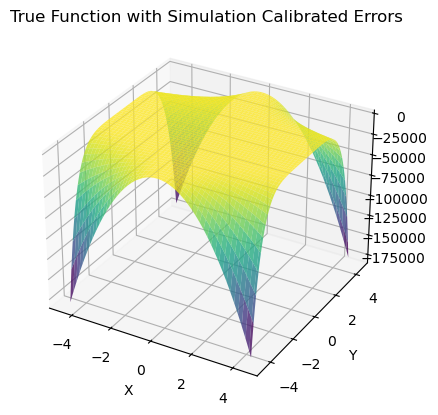

In [ ]:
sim_z_grid = sim_eval(x_grid, y_grid, bo.x_opt[0], bo.x_opt[1])

# Create the plot
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.plot_surface(x_grid, y_grid, sim_z_grid, cmap='viridis', alpha=0.8)

# Customize the plot
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_title('True Function with Simulation Calibrated Errors')

# Show the plot
plt.show()

In [ ]:
round_val_df

,Highest_phy_Response,Round_num
0,-64.660164,0
1,-5.021471,1
2,-2.845895,2


In [ ]:
df_new3 = pd.DataFrame

df_sim = df.copy()

Best hyperparameters:
num_layers: 8
num_units: 137
learning_rate: 0.0014108892283675816
dropout_rate: 0.3793078121611787
batch_size: 34
epochs: 121
Epoch 1/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step - loss: 542480.9375
Epoch 2/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 542394.3125
Epoch 3/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 542366.0625
Epoch 4/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 542309.1250
Epoch 5/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 542127.8750
Epoch 6/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 542129.9375
Epoch 7/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 542057.2500
Epoch 8/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 541980.8750
Epoch 9/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 541585.8125
Epoch 10/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 541382.9375
Epoch 11/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 540980.0000
Epoch 12/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 540767.5000
Epoch 13/20

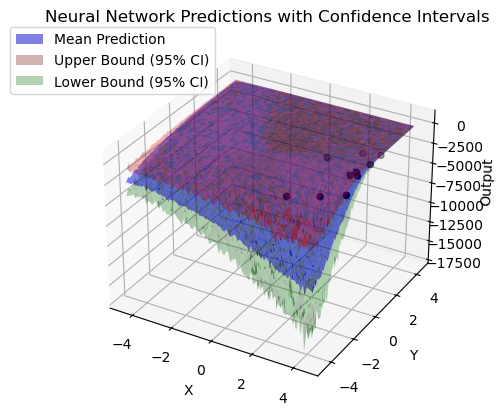

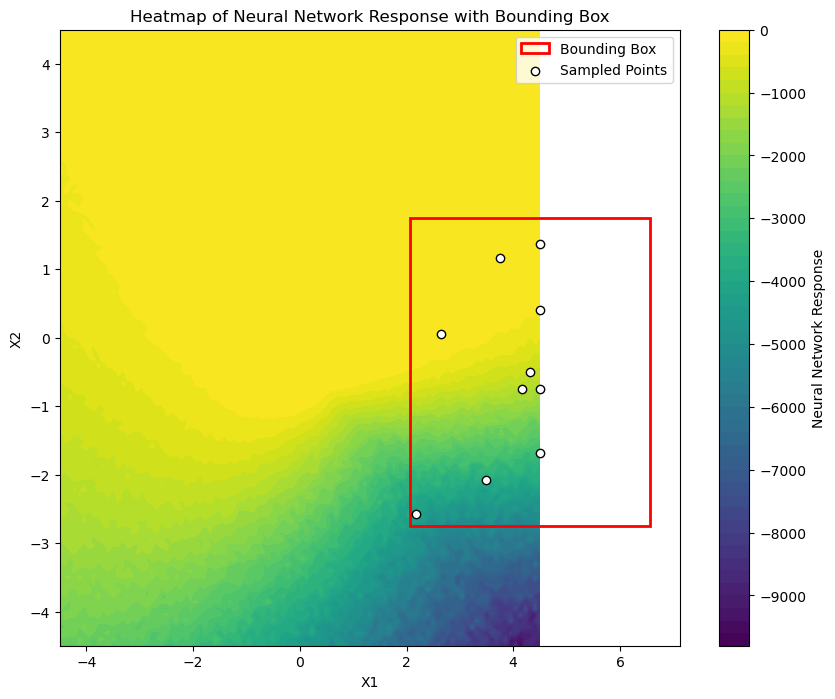

In [ ]:
df_sim, df_new3 = perform_iteration(df_sim, df)

Best hyperparameters:
num_layers: 3
num_units: 200
learning_rate: 0.1
dropout_rate: 0.0
batch_size: 113
epochs: 171
Epoch 1/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - loss: 526040.5625
Epoch 2/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 324039.3438
Epoch 3/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - loss: 1280191.2500
Epoch 4/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 253303.9844
Epoch 5/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 485655.9062
Epoch 6/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 524478.7500
Epoch 7/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 530093.2500
Epoch 8/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 530996.3750
Epoch 9/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 525246.7500
Epoch 10/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 513843.1250
Epoch 11/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 487750.9062
Epoch 12/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 427955.5625
Epoch 13/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 3

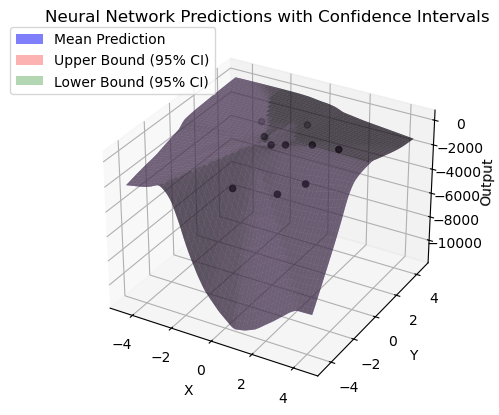

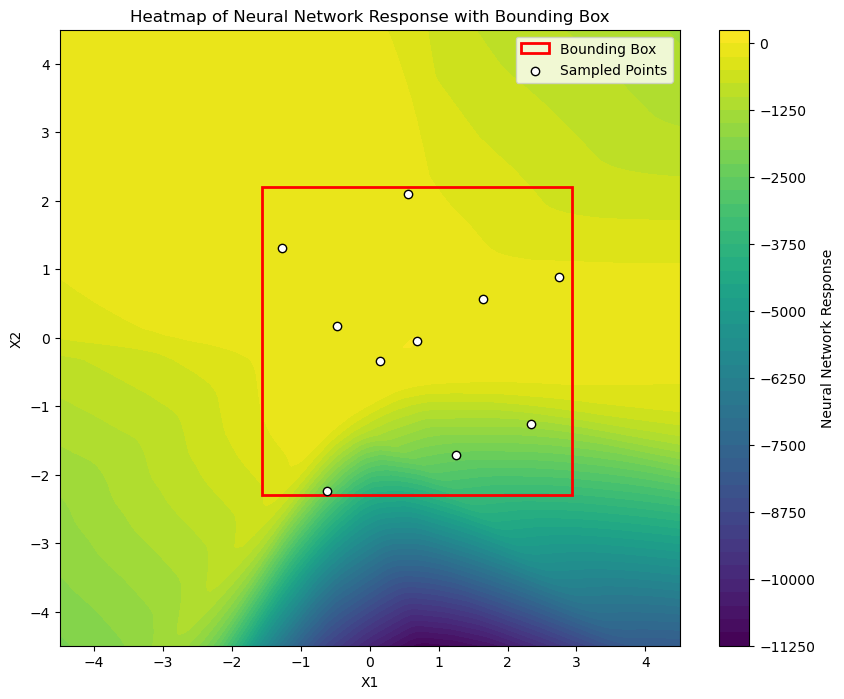

In [ ]:
df_sim, df_new3 = perform_iteration(df_sim, df)

Best hyperparameters:
num_layers: 4
num_units: 108
learning_rate: 0.04077499365367614
dropout_rate: 0.22497499495561385
batch_size: 100
epochs: 185
Epoch 1/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 376434.3750
Epoch 2/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 365851.4062
Epoch 3/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 299966.4688
Epoch 4/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 219767.1406
Epoch 5/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 153184.0469
Epoch 6/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 102360.5000
Epoch 7/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 113216.7031
Epoch 8/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 89900.1406
Epoch 9/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 141290.3594
Epoch 10/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 83044.6016
Epoch 11/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 87372.2969
Epoch 12/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 46547.8281
Epoch 13/200
1/

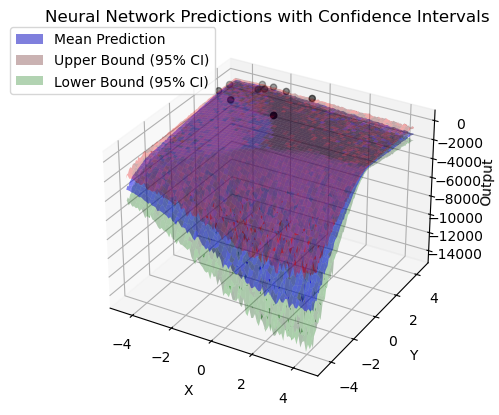

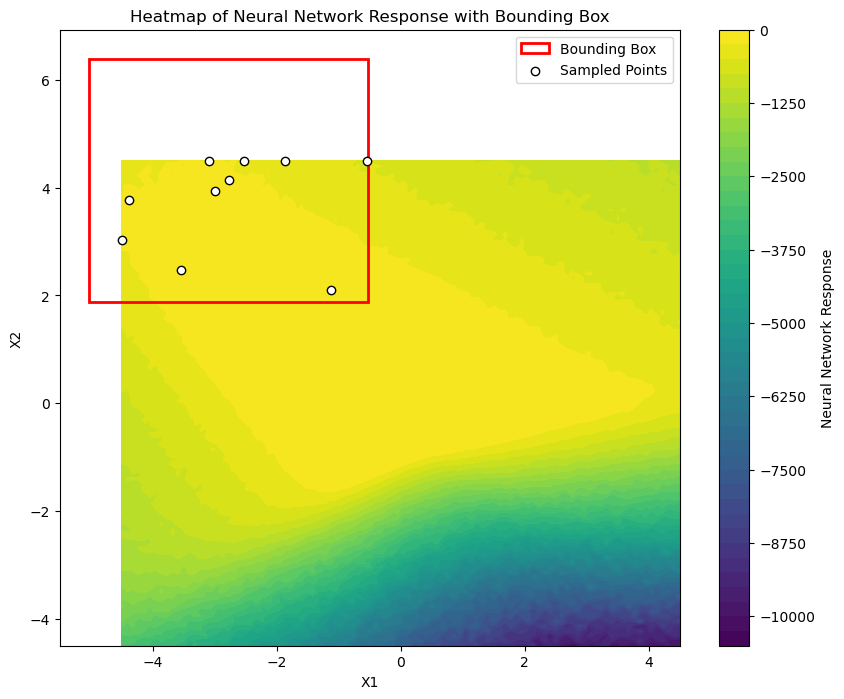

In [ ]:
df_sim, df_new3 = perform_iteration(df_sim, df)

Best hyperparameters:
num_layers: 3
num_units: 146
learning_rate: 0.04255350900069034
dropout_rate: 0.0
batch_size: 150
epochs: 200
Epoch 1/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step - loss: 352676544.0000
Epoch 2/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step - loss: 352463392.0000
Epoch 3/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 351381248.0000
Epoch 4/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - loss: 348277728.0000
Epoch 5/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 341415744.0000
Epoch 6/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 328593952.0000
Epoch 7/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 307119008.0000
Epoch 8/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 274749952.0000
Epoch 9/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 231457792.0000
Epoch 10/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 183180288.0000
Epoch 11/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 150449248.0000
Epoch 12/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 171637

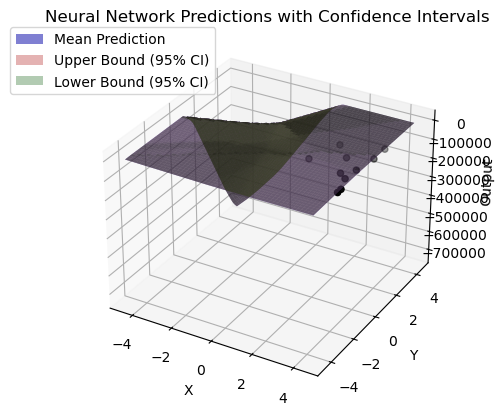

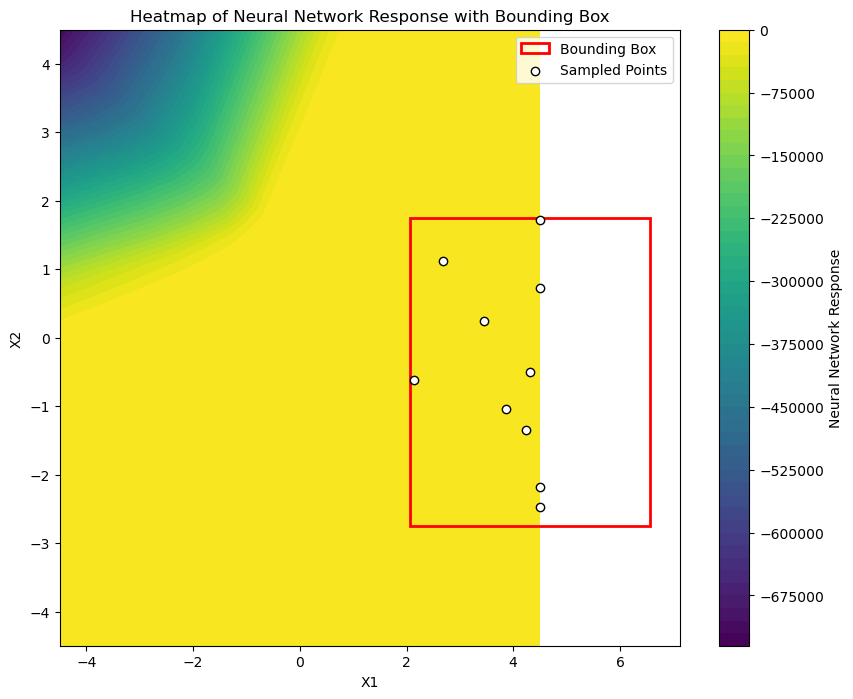

In [ ]:
df_sim, df_new3 = perform_iteration(df_sim, df)

Best hyperparameters:
num_layers: 7
num_units: 200
learning_rate: 0.0029338660894280594
dropout_rate: 0.0
batch_size: 150
epochs: 200
Epoch 1/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 289299264.0000
Epoch 2/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 289295264.0000
Epoch 3/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 289283328.0000
Epoch 4/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 289252352.0000
Epoch 5/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 289178336.0000
Epoch 6/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 289013920.0000
Epoch 7/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 288670208.0000
Epoch 8/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 287986720.0000
Epoch 9/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 286692224.0000
Epoch 10/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 284344224.0000
Epoch 11/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 280236448.0000
Epoch 12/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 2733

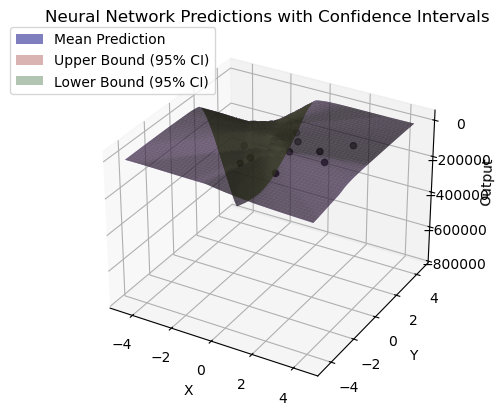

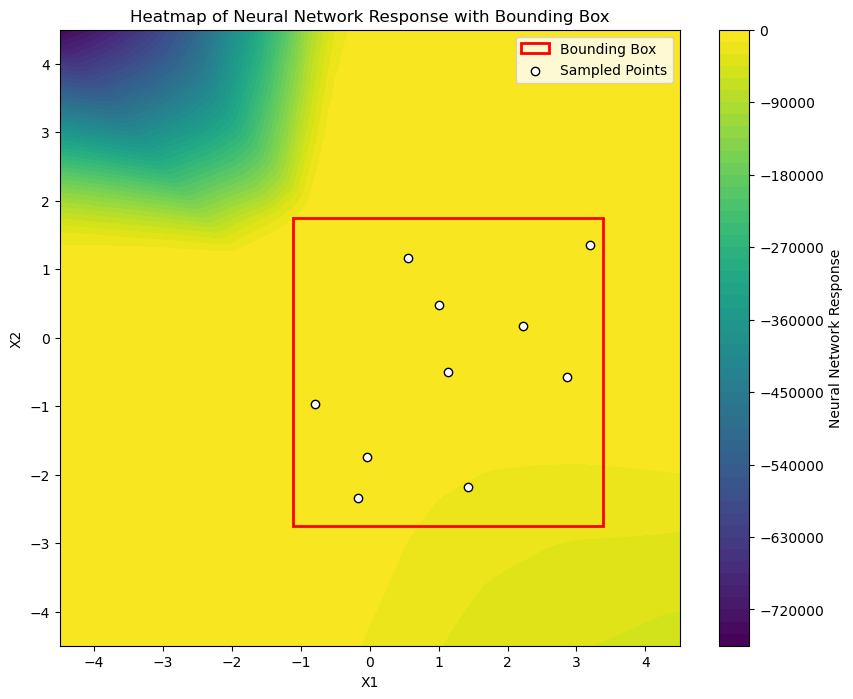

In [ ]:
df_sim, df_new3 = perform_iteration(df_sim, df)

Best hyperparameters:
num_layers: 6
num_units: 200
learning_rate: 0.002255095170959788
dropout_rate: 0.0
batch_size: 148
epochs: 200
Epoch 1/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 244792384.0000
Epoch 2/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 244788000.0000
Epoch 3/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 244779776.0000
Epoch 4/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 244763744.0000
Epoch 5/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 244734064.0000
Epoch 6/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 244681200.0000
Epoch 7/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 244589360.0000
Epoch 8/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 244434880.0000
Epoch 9/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 244179760.0000
Epoch 10/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 243771344.0000
Epoch 11/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 243133632.0000
Epoch 12/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 24215

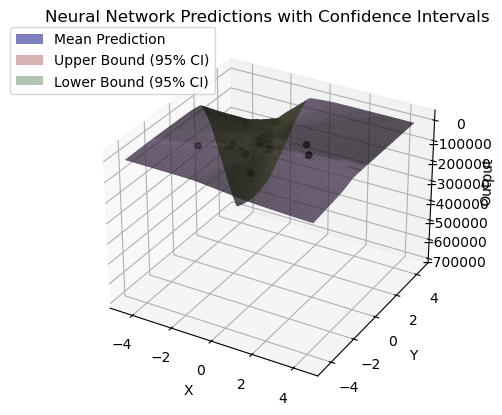

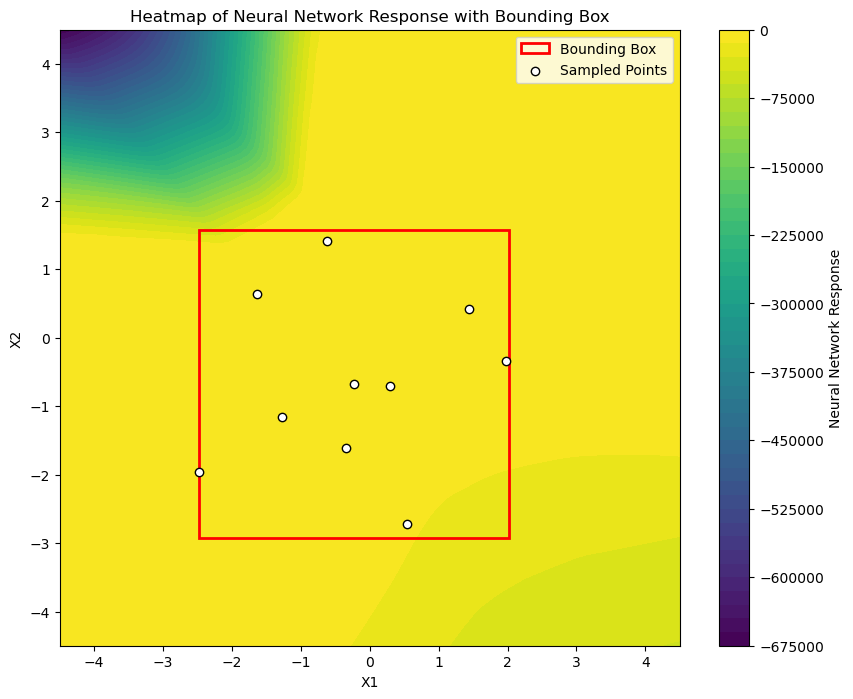

In [ ]:
df_sim, df_new3 = perform_iteration(df_sim, df)

Best hyperparameters:
num_layers: 4
num_units: 50
learning_rate: 0.014691649019960479
dropout_rate: 0.0
batch_size: 150
epochs: 199
Epoch 1/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - loss: 212160176.0000
Epoch 2/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 212150864.0000
Epoch 3/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 212136192.0000
Epoch 4/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 212108512.0000
Epoch 5/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 212061104.0000
Epoch 6/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 211982240.0000
Epoch 7/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 211854976.0000
Epoch 8/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 211657520.0000
Epoch 9/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 211359616.0000
Epoch 10/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 210921152.0000
Epoch 11/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 210292336.0000
Epoch 12/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 209410

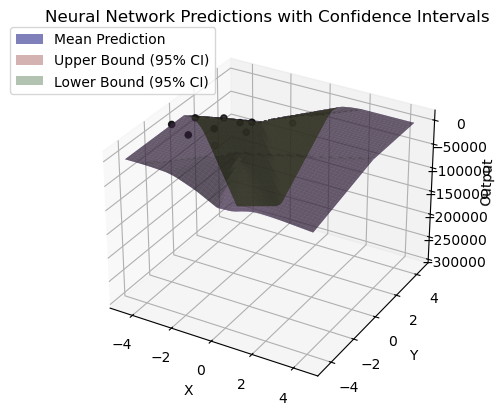

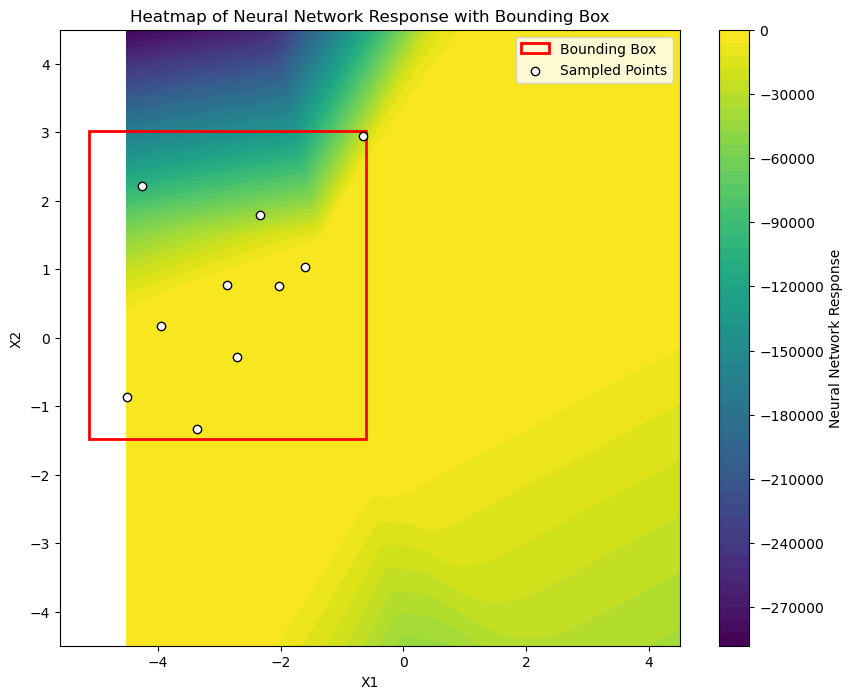

In [ ]:
df_sim, df_new3 = perform_iteration(df_sim, df)

Best hyperparameters:
num_layers: 3
num_units: 115
learning_rate: 0.06351674272927528
dropout_rate: 0.0
batch_size: 150
epochs: 200
Epoch 1/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - loss: 187239840.0000
Epoch 2/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 186910416.0000
Epoch 3/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 185181104.0000
Epoch 4/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 180086960.0000
Epoch 5/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 169315248.0000
Epoch 6/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 150508912.0000
Epoch 7/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 125018584.0000
Epoch 8/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 107807432.0000
Epoch 9/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 126029032.0000
Epoch 10/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 118354688.0000
Epoch 11/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 100899528.0000
Epoch 12/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 943945

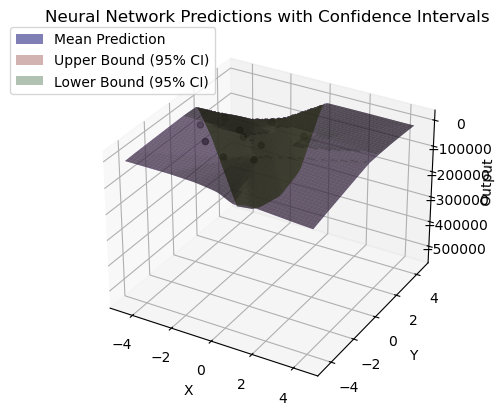

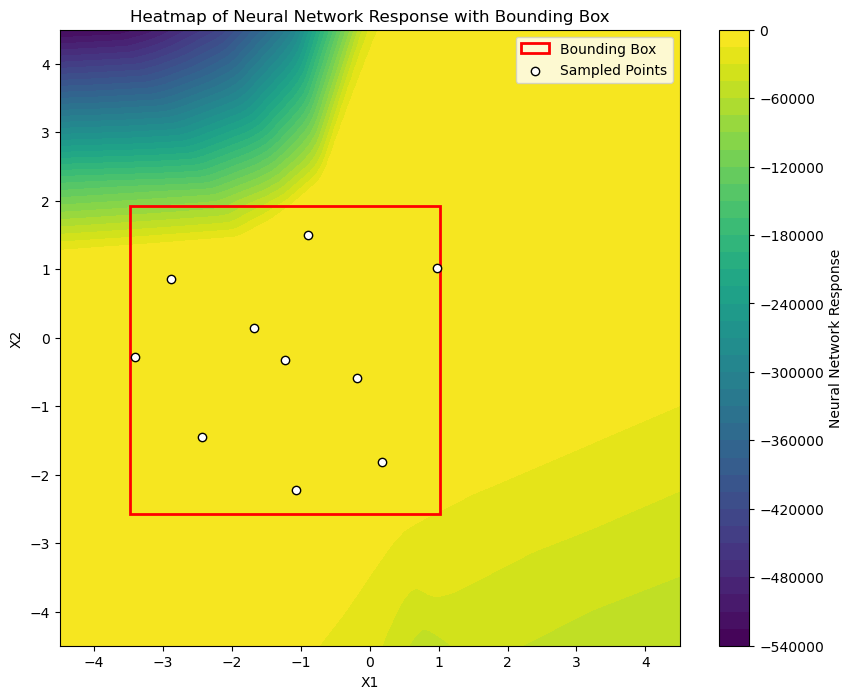

In [ ]:
df_sim, df_new3 = perform_iteration(df_sim, df)

Best hyperparameters:
num_layers: 10
num_units: 50
learning_rate: 0.006146789204763247
dropout_rate: 0.0
batch_size: 127
epochs: 200
Epoch 1/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step - loss: 167531488.0000
Epoch 2/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 167530800.0000
Epoch 3/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 167529056.0000
Epoch 4/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 167524768.0000
Epoch 5/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 167515136.0000
Epoch 6/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 167494864.0000
Epoch 7/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 167453168.0000
Epoch 8/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 167370272.0000
Epoch 9/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 167209616.0000
Epoch 10/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 166907072.0000
Epoch 11/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 166337024.0000
Epoch 12/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 16529

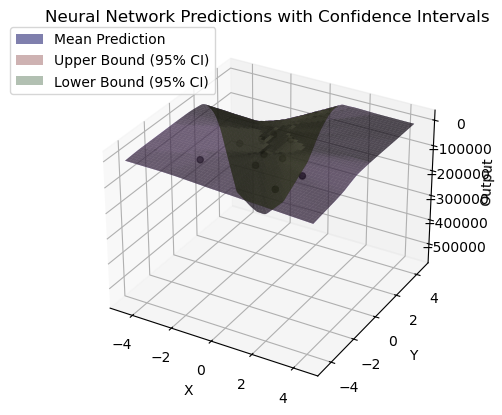

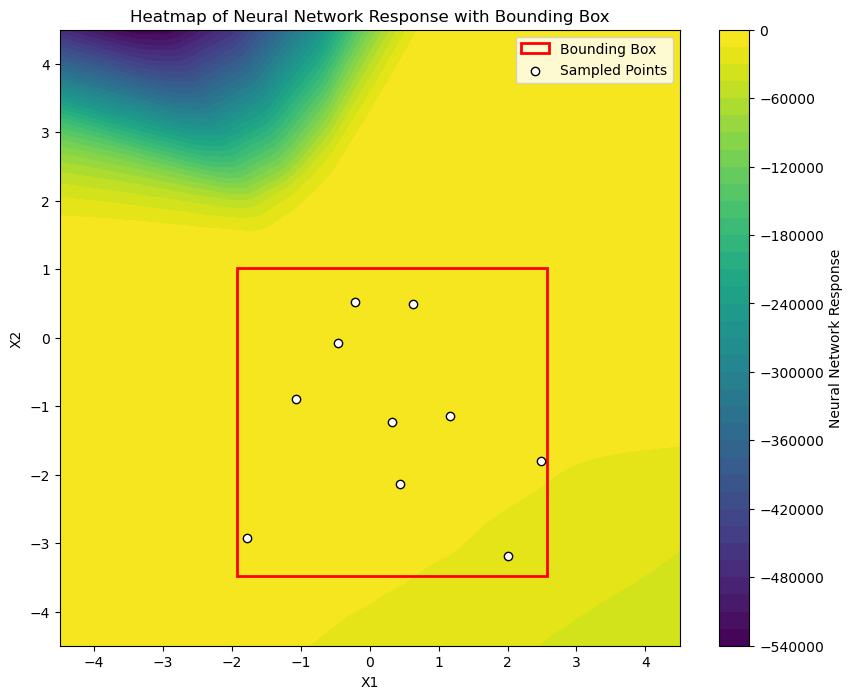

In [ ]:
df_sim, df_new3 = perform_iteration(df_sim, df)

Best hyperparameters:
num_layers: 2
num_units: 192
learning_rate: 0.06191950017492587
dropout_rate: 0.5
batch_size: 61
epochs: 200
Epoch 1/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - loss: 151845664.0000
Epoch 2/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 151687616.0000
Epoch 3/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 151214992.0000
Epoch 4/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - loss: 150288160.0000
Epoch 5/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 148550256.0000
Epoch 6/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 145944288.0000
Epoch 7/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 141250816.0000
Epoch 8/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 137158656.0000
Epoch 9/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 130757712.0000
Epoch 10/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 122134648.0000
Epoch 11/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 115078448.0000
Epoch 12/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 1094650

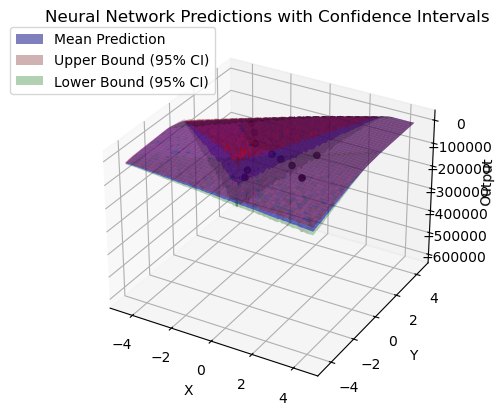

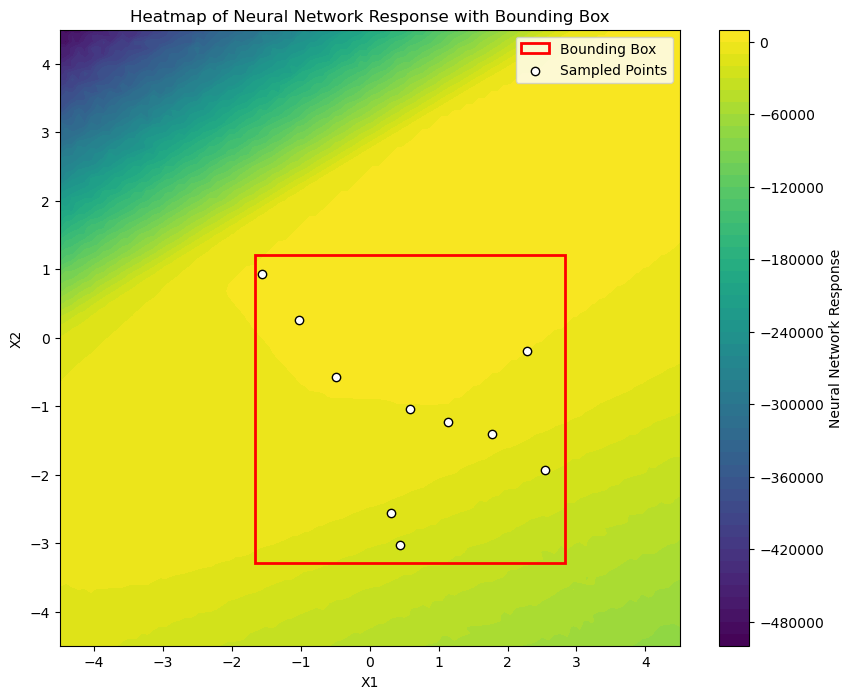

In [ ]:
df_sim, df_new3 = perform_iteration(df_sim, df)

Best hyperparameters:
num_layers: 4
num_units: 200
learning_rate: 0.1
dropout_rate: 0.0
batch_size: 20
epochs: 50
Epoch 1/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 138645264.0000
Epoch 2/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 124027120.0000
Epoch 3/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 210185712.0000
Epoch 4/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 115829792.0000
Epoch 5/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 137185520.0000
Epoch 6/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - loss: 138545984.0000
Epoch 7/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 138348352.0000
Epoch 8/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - loss: 137818144.0000
Epoch 9/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 135638480.0000
Epoch 10/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 128701696.0000
Epoch 11/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 111996560.0000
Epoch 12/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 81033392.0000
Epoch 13/2

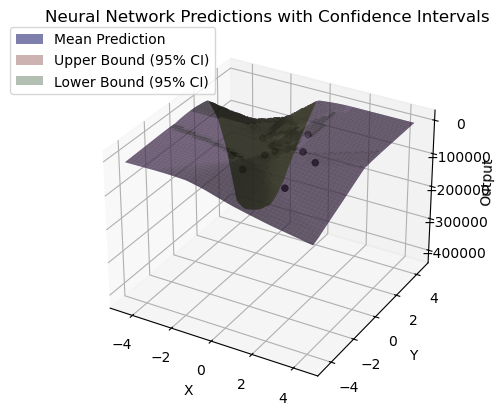

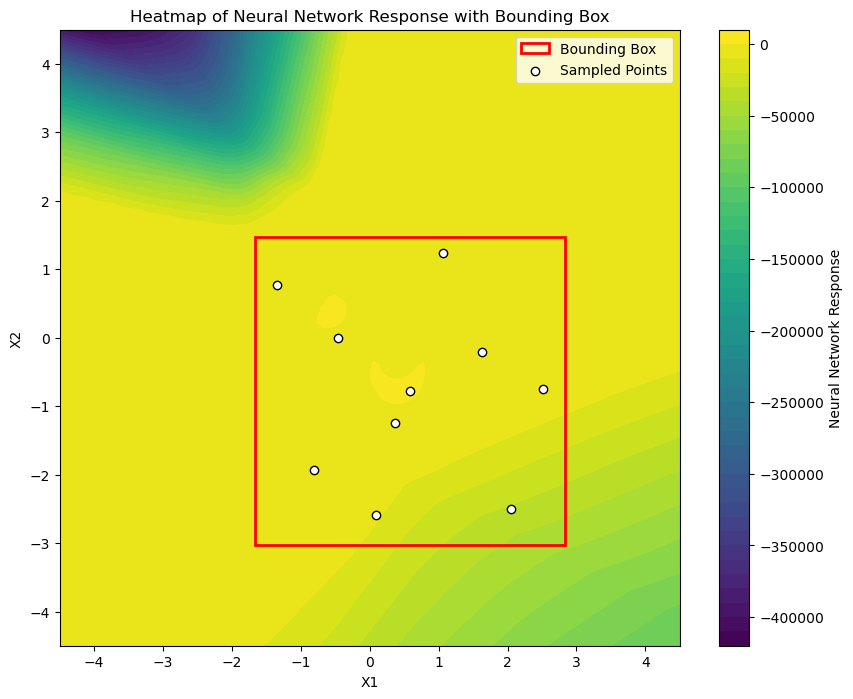

In [ ]:
df_sim, df_new3 = perform_iteration(df_sim, df)

In [ ]:
new_entry1 = pd.DataFrame({"Highest_phy_Response": [df_new3['z'].max()],
                          "Round_num": [3]})
round_val_df = pd.concat([round_val_df, new_entry1], ignore_index=True)

In [ ]:
df = pd.concat([df, df_new3], ignore_index=True)

In [ ]:
from GPyOpt.methods import BayesianOptimization

def sim_all(x):
    df["a"] = x[0,0]
    df["b"] = x[0,1]
    df["sim_z"] = sim_eval(df["x"], df["y"], df["a"], df["b"])
    df["diff"] = df["z"] - df["sim_z"]
    return (df["diff"]**2).sum()

bo_domain = [{'name': 'a', 'type': 'continuous', 'domain': (-10,10)},
          {'name': 'b', 'type': 'continuous', 'domain': (-10,10)}]

# Calibrate the sim model using physical tests so far, update df["a"] and df["b"] with calibrated parameters
bo = BayesianOptimization(f=sim_all, domain=bo_domain, acquisition_type='EI')
bo.run_optimization(max_iter=max_bo_iter)
df["a"] = bo.x_opt[0]
df["b"] = bo.x_opt[1]
print(bo.x_opt)

[ 4.21348551 -3.02011007]


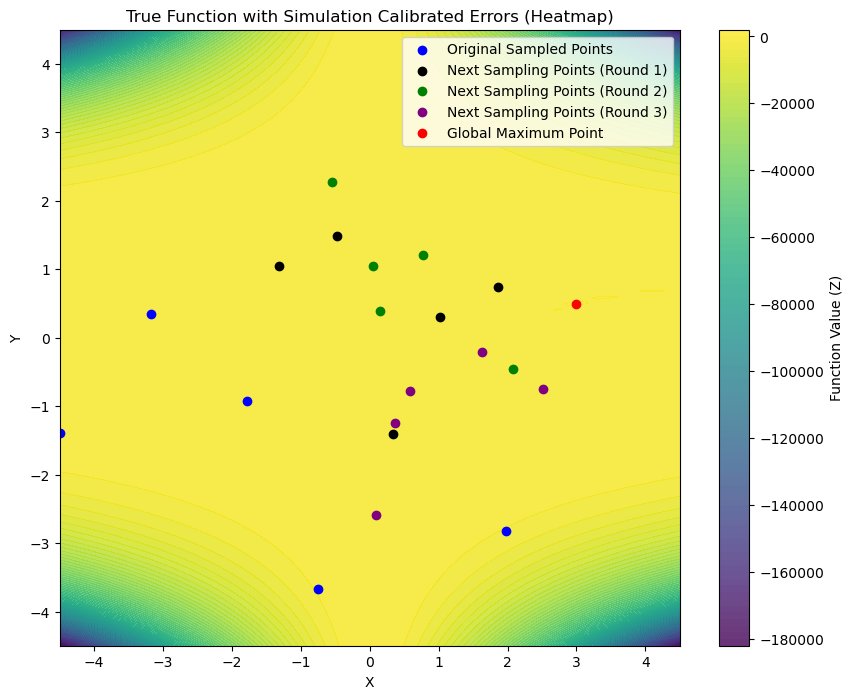

In [ ]:
# Create the heatmap plot
fig, ax = plt.subplots(figsize=(10, 8))

# Plot the heatmap for sim_z_grid
heatmap = ax.contourf(x_grid, y_grid, sim_z_grid, levels=100, cmap='viridis', alpha=0.8)

# Overlay scatter points for sampling points
ax.scatter(df_original["x"], df_original["y"], color='blue', marker='o', label='Original Sampled Points')
ax.scatter(df_new["x"], df_new["y"], color='black', marker='o', label='Next Sampling Points (Round 1)')
ax.scatter(df_new2["x"], df_new2["y"], color='green', marker='o', label='Next Sampling Points (Round 2)')
ax.scatter(df_new3["x"], df_new3["y"], color='purple', marker='o', label='Next Sampling Points (Round 3)')

# Overlay scatter points for global maxima
ax.scatter(global_maxima_df['X'], global_maxima_df['Y'], color='red', marker='o', label='Global Maximum Point')

# Customize the plot
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_title('True Function with Simulation Calibrated Errors (Heatmap)')
ax.legend()

# Add a color bar
cbar = plt.colorbar(heatmap, ax=ax)
cbar.set_label('Function Value (Z)')

# Show the plot
plt.show()

In [ ]:
round_val_df

,Highest_phy_Response,Round_num
0,-64.660164,0
1,-5.021471,1
2,-2.845895,2
3,-1.658476,3


In [ ]:
round_val_df.to_excel("ENN_round.xlsx", index=False) 

In [ ]:
df_new.to_excel("ENN_round1.xlsx", index=False) 
df_new2.to_excel("ENN_round2.xlsx", index=False) 
df_new3.to_excel("ENN_round3.xlsx", index=False) 
df_original.to_excel("ENN_round_ori.xlsx", index=False) 

In [ ]:
df_new4 = pd.DataFrame

df_sim = df.copy()

Best hyperparameters:
num_layers: 2
num_units: 50
learning_rate: 0.002370750820916704
dropout_rate: 0.29220286996086475
batch_size: 20
epochs: 200
Epoch 1/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - loss: 406909.0625
Epoch 2/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 406848.4062
Epoch 3/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 406852.4688
Epoch 4/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 406764.3438
Epoch 5/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 406676.7812
Epoch 6/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 406612.2188
Epoch 7/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 406481.0625
Epoch 8/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 406553.0625
Epoch 9/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 406479.6250
Epoch 10/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 406424.5000
Epoch 11/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 406178.4062
Epoch 12/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 406295.5938
Epoch 13/200

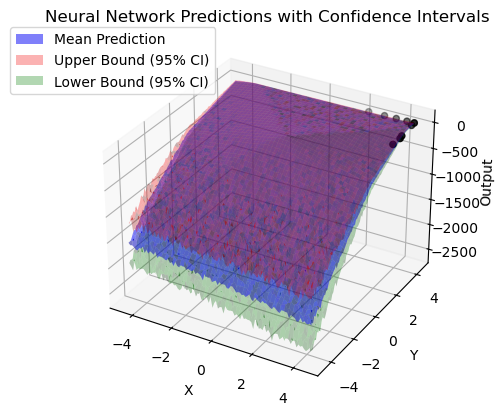

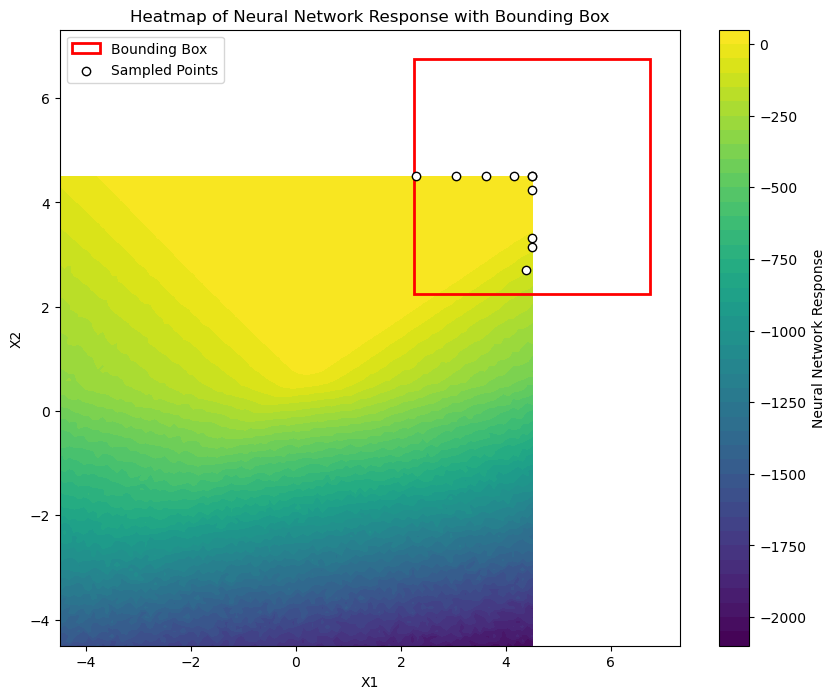

In [ ]:
df_sim, df_new4 = perform_iteration(df_sim, df)

Best hyperparameters:
num_layers: 5
num_units: 50
learning_rate: 0.1
dropout_rate: 0.0
batch_size: 150
epochs: 200
Epoch 1/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 4046017280.0000
Epoch 2/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 4041381632.0000
Epoch 3/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 3975401216.0000
Epoch 4/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 3612999936.0000
Epoch 5/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 2430780928.0000
Epoch 6/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 1060364608.0000
Epoch 7/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 3648514560.0000
Epoch 8/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 948904640.0000
Epoch 9/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 1612420224.0000
Epoch 10/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 2287077888.0000
Epoch 11/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 2624549120.0000
Epoch 12/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 2741164544.00

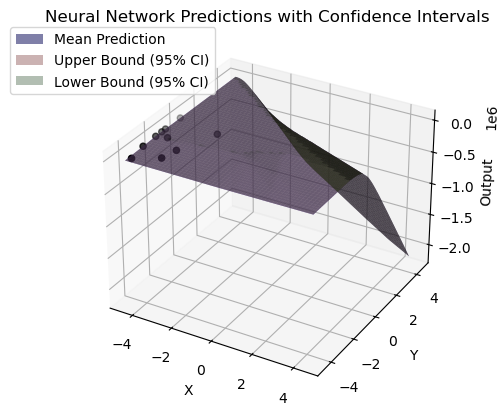

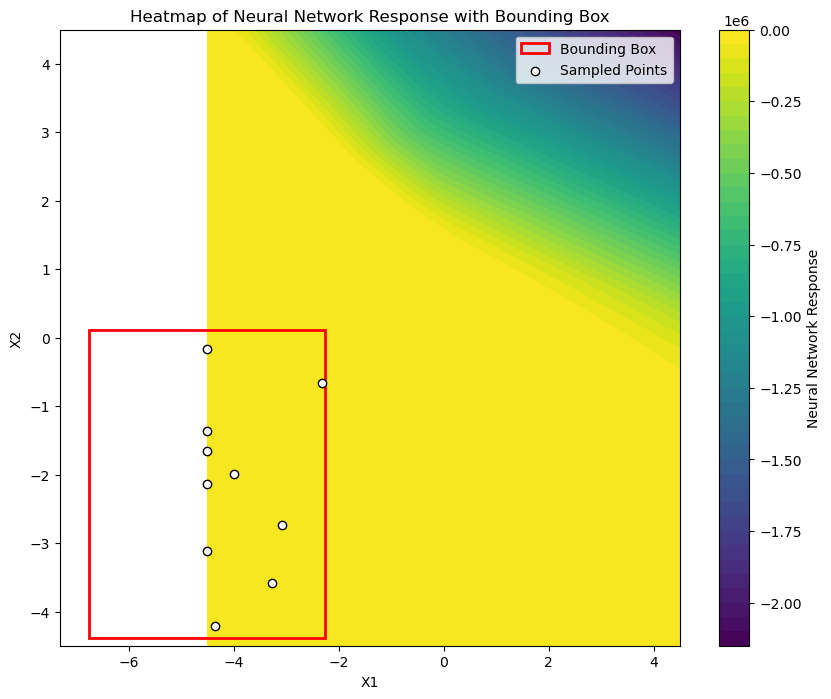

In [ ]:
df_sim, df_new4 = perform_iteration(df_sim, df)

Best hyperparameters:
num_layers: 9
num_units: 135
learning_rate: 0.001729414225394246
dropout_rate: 0.0
batch_size: 20
epochs: 152
Epoch 1/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step - loss: 3408284928.0000
Epoch 2/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 3408276224.0000
Epoch 3/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 3408260352.0000
Epoch 4/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 3408231680.0000
Epoch 5/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 3408180480.0000
Epoch 6/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 3408092672.0000
Epoch 7/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 3407945984.0000
Epoch 8/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 3407704064.0000
Epoch 9/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 3407308800.0000
Epoch 10/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 3406672640.0000
Epoch 11/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 3405649920.0000
Epoch 12/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - l

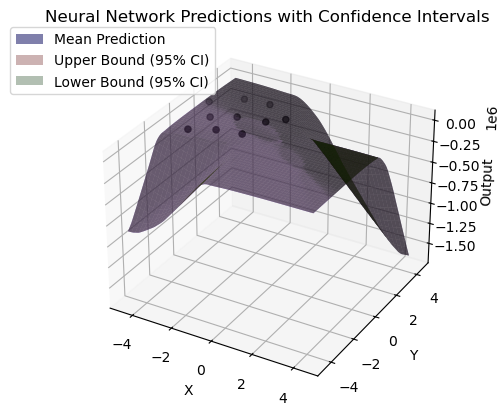

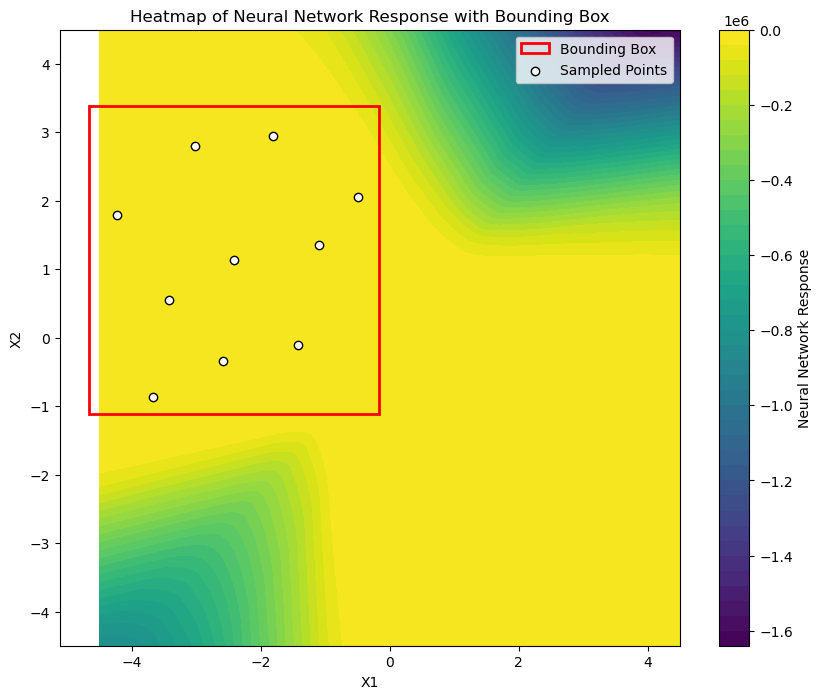

In [ ]:
df_sim, df_new4 = perform_iteration(df_sim, df)

Best hyperparameters:
num_layers: 2
num_units: 200
learning_rate: 0.06982487257411321
dropout_rate: 0.2861749237436919
batch_size: 20
epochs: 200
Epoch 1/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 2727031808.0000
Epoch 2/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - loss: 2725925888.0000
Epoch 3/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 2722264064.0000
Epoch 4/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 2714065664.0000
Epoch 5/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 2697121024.0000
Epoch 6/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - loss: 2674052096.0000
Epoch 7/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 2644987904.0000
Epoch 8/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 2591189504.0000
Epoch 9/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 2528479232.0000
Epoch 10/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 2449025024.0000
Epoch 11/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 2350376192.0000
Epoch 12/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s

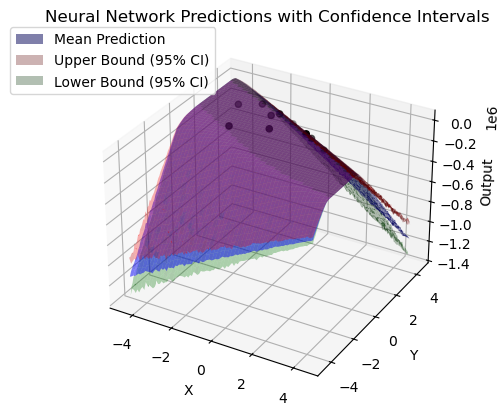

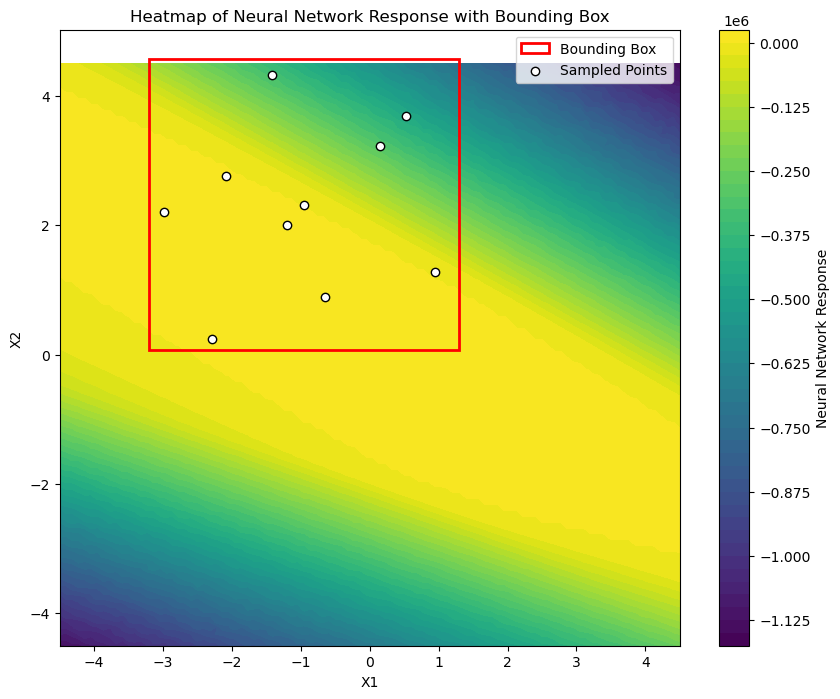

In [ ]:
df_sim, df_new4 = perform_iteration(df_sim, df)

Best hyperparameters:
num_layers: 2
num_units: 151
learning_rate: 0.1
dropout_rate: 0.20637700072766713
batch_size: 150
epochs: 200
Epoch 1/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 2275257856.0000
Epoch 2/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - loss: 2274042880.0000
Epoch 3/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 2269790464.0000
Epoch 4/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - loss: 2260326912.0000
Epoch 5/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 2242423296.0000
Epoch 6/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 2214898944.0000
Epoch 7/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 2167988480.0000
Epoch 8/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 2110613632.0000
Epoch 9/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 2035388416.0000
Epoch 10/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 1954242688.0000
Epoch 11/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step - loss: 1845317120.0000
Epoch 12/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - l

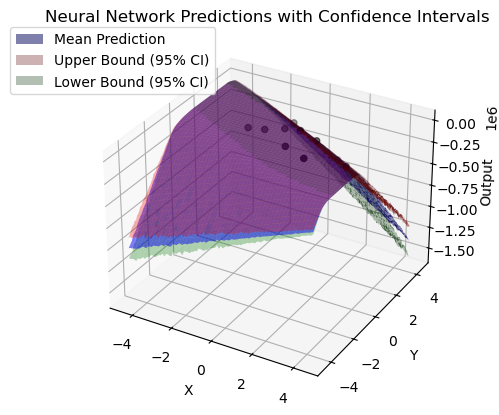

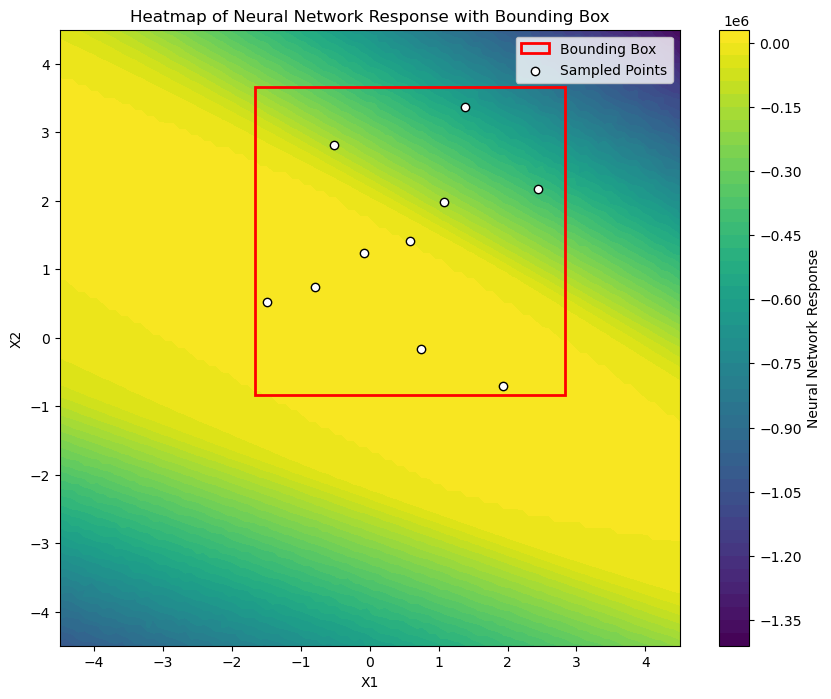

In [ ]:
df_sim, df_new4 = perform_iteration(df_sim, df)

Best hyperparameters:
num_layers: 2
num_units: 50
learning_rate: 0.1
dropout_rate: 0.0
batch_size: 80
epochs: 200
Epoch 1/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - loss: 1950390272.0000
Epoch 2/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 1950135680.0000
Epoch 3/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - loss: 1949485056.0000
Epoch 4/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 1948081536.0000
Epoch 5/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 1945623168.0000
Epoch 6/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 1941761408.0000
Epoch 7/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 1936114816.0000
Epoch 8/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 1928268672.0000
Epoch 9/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 1917787520.0000
Epoch 10/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 1904214912.0000
Epoch 11/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - loss: 1887089792.0000
Epoch 12/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 1865962112.00

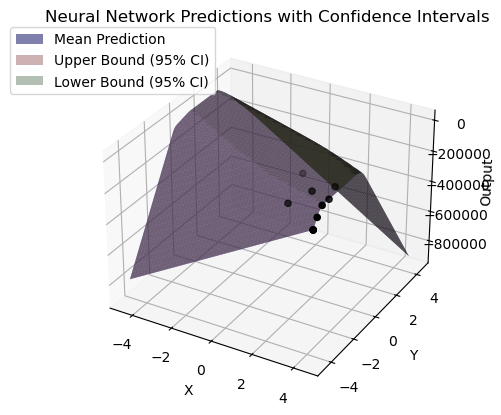

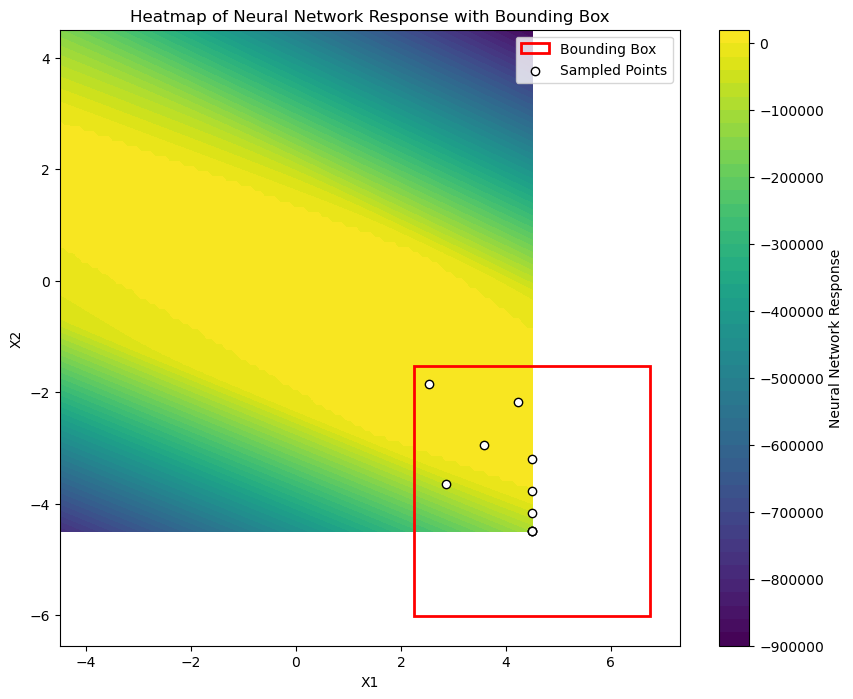

In [ ]:
df_sim, df_new4 = perform_iteration(df_sim, df)

Best hyperparameters:
num_layers: 5
num_units: 200
learning_rate: 0.005881042835445745
dropout_rate: 0.0
batch_size: 59
epochs: 149
Epoch 1/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 3126028288.0000
Epoch 2/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 3125946880.0000
Epoch 3/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 3125676288.0000
Epoch 4/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 3124898816.0000
Epoch 5/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 3123025152.0000
Epoch 6/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 3119033344.0000
Epoch 7/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 3111276032.0000
Epoch 8/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 3097236736.0000
Epoch 9/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 3073197568.0000
Epoch 10/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 3033956352.0000
Epoch 11/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 2972564224.0000
Epoch 12/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - l

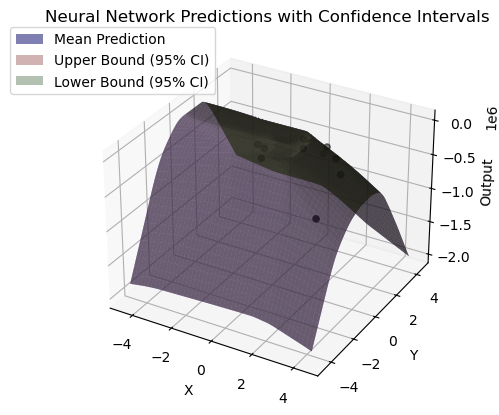

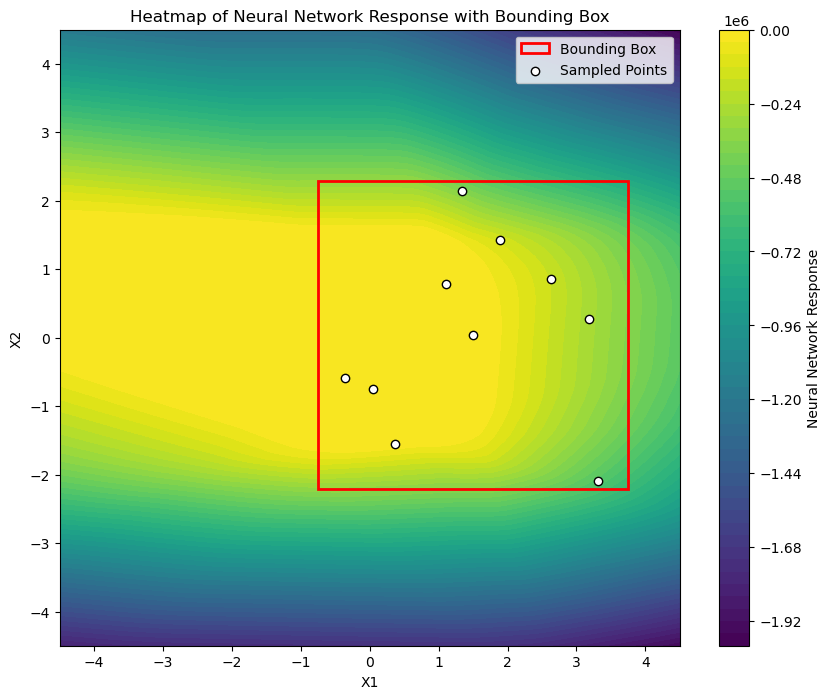

In [ ]:
df_sim, df_new4 = perform_iteration(df_sim, df)

Best hyperparameters:
num_layers: 3
num_units: 200
learning_rate: 0.018022820881534656
dropout_rate: 0.0
batch_size: 150
epochs: 200
Epoch 1/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 2778711040.0000
Epoch 2/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step - loss: 2778460928.0000
Epoch 3/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - loss: 2777655552.0000
Epoch 4/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 2775730944.0000
Epoch 5/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 2771949312.0000
Epoch 6/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step - loss: 2765270784.0000
Epoch 7/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 2754415360.0000
Epoch 8/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 2737698304.0000
Epoch 9/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 2712959232.0000
Epoch 10/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - loss: 2677686528.0000
Epoch 11/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 2629122048.0000
Epoch 12/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step - 

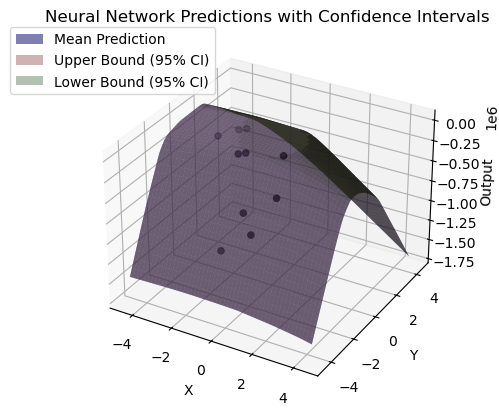

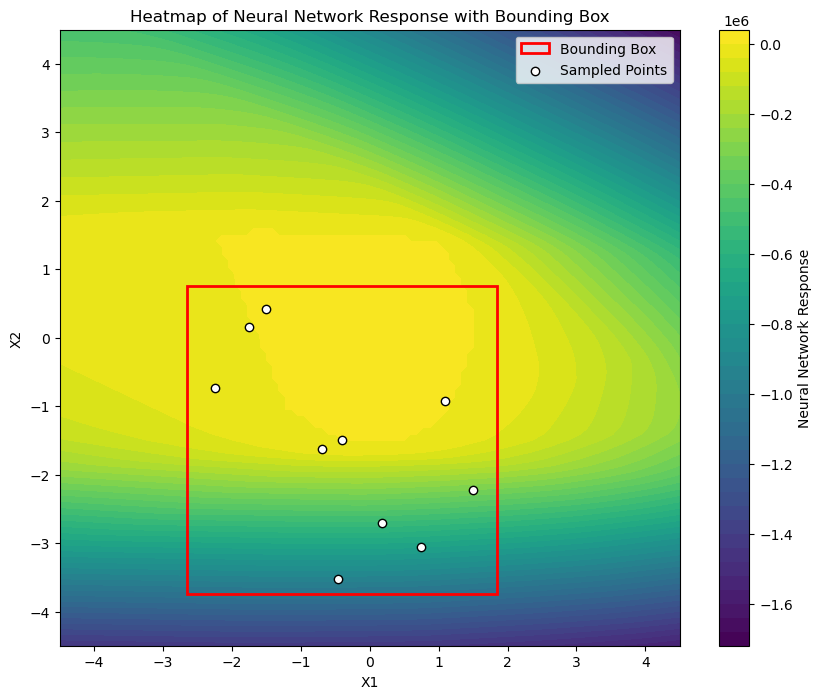

In [ ]:
df_sim, df_new4 = perform_iteration(df_sim, df)

Best hyperparameters:
num_layers: 5
num_units: 200
learning_rate: 0.012962181559854026
dropout_rate: 0.0
batch_size: 150
epochs: 200
Epoch 1/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 2500848128.0000
Epoch 2/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 2500583680.0000
Epoch 3/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 2498618624.0000
Epoch 4/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 2490667776.0000
Epoch 5/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - loss: 2466880256.0000
Epoch 6/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - loss: 2408899328.0000
Epoch 7/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step - loss: 2287437312.0000
Epoch 8/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 2066719488.0000
Epoch 9/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 1744082176.0000
Epoch 10/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - loss: 1487045760.0000
Epoch 11/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step - loss: 1804337152.0000
Epoch 12/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step - 

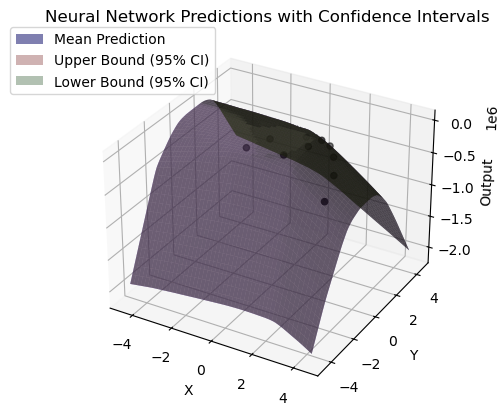

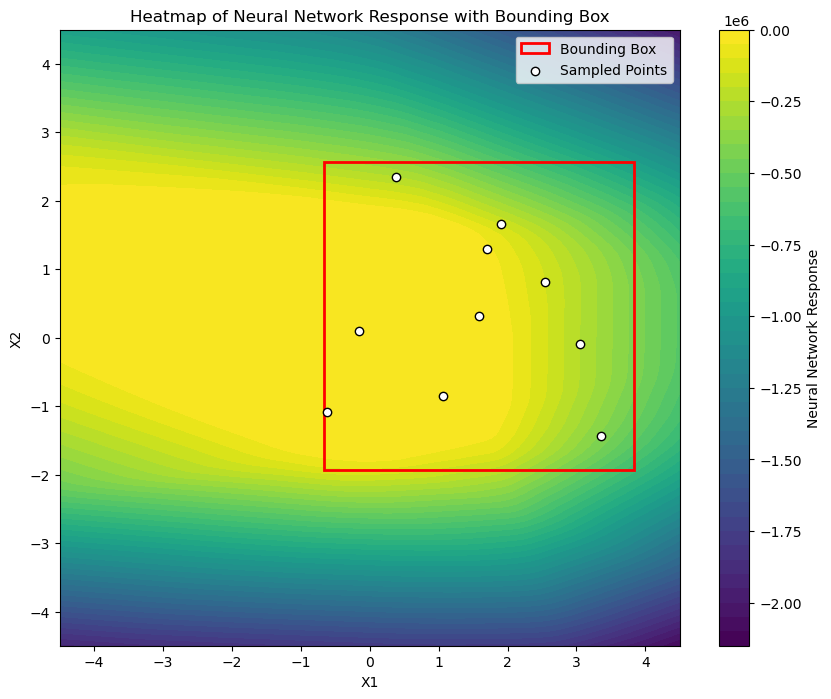

In [ ]:
df_sim, df_new4 = perform_iteration(df_sim, df)

Best hyperparameters:
num_layers: 4
num_units: 200
learning_rate: 0.03453625304027348
dropout_rate: 0.0
batch_size: 150
epochs: 200
Epoch 1/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 2273501952.0000
Epoch 2/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 2272175872.0000
Epoch 3/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 2259406592.0000
Epoch 4/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 2207410944.0000
Epoch 5/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 2062532864.0000
Epoch 6/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 1768186496.0000
Epoch 7/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 1439719552.0000
Epoch 8/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 1789788544.0000
Epoch 9/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 1390748672.0000
Epoch 10/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 1257225472.0000
Epoch 11/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 1317315840.0000
Epoch 12/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - l

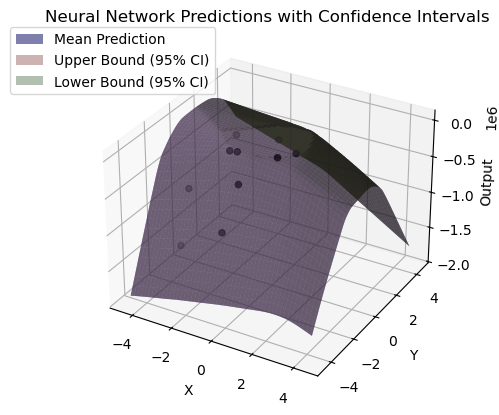

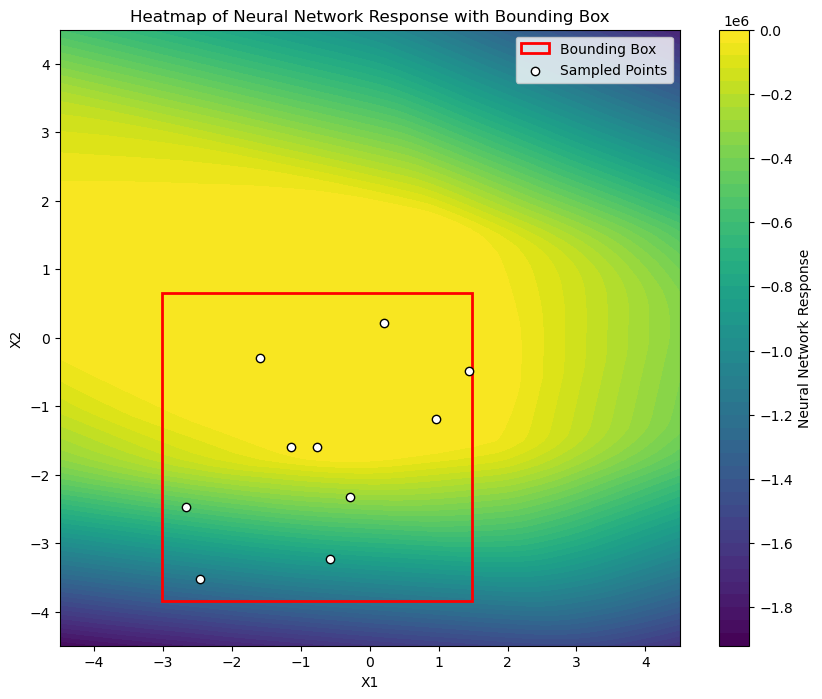

In [ ]:
df_sim, df_new4 = perform_iteration(df_sim, df)

In [ ]:
new_entry1 = pd.DataFrame({"Highest_phy_Response": [df_new4['z'].max()],
                          "Round_num": [4]})
round_val_df = pd.concat([round_val_df, new_entry1], ignore_index=True)

In [ ]:
df = pd.concat([df, df_new4], ignore_index=True)

In [ ]:
from GPyOpt.methods import BayesianOptimization

def sim_all(x):
    df["a"] = x[0,0]
    df["b"] = x[0,1]
    df["sim_z"] = sim_eval(df["x"], df["y"], df["a"], df["b"])
    df["diff"] = df["z"] - df["sim_z"]
    return (df["diff"]**2).sum()

bo_domain = [{'name': 'a', 'type': 'continuous', 'domain': (-10,10)},
          {'name': 'b', 'type': 'continuous', 'domain': (-10,10)}]

# Calibrate the sim model using physical tests so far, update df["a"] and df["b"] with calibrated parameters
bo = BayesianOptimization(f=sim_all, domain=bo_domain, acquisition_type='EI')
bo.run_optimization(max_iter=max_bo_iter)
df["a"] = bo.x_opt[0]
df["b"] = bo.x_opt[1]
print(bo.x_opt)

[ 4.26178481 -2.97493135]


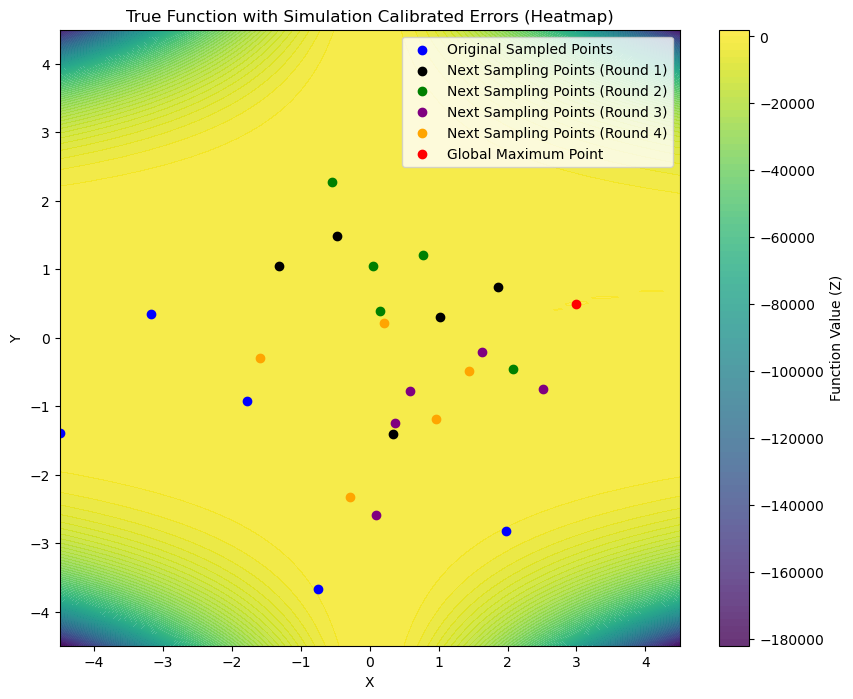

In [ ]:
# Create the heatmap plot
fig, ax = plt.subplots(figsize=(10, 8))

# Plot the heatmap for sim_z_grid
heatmap = ax.contourf(x_grid, y_grid, sim_z_grid, levels=100, cmap='viridis', alpha=0.8)

# Overlay scatter points for sampling points
ax.scatter(df_original["x"], df_original["y"], color='blue', marker='o', label='Original Sampled Points')
ax.scatter(df_new["x"], df_new["y"], color='black', marker='o', label='Next Sampling Points (Round 1)')
ax.scatter(df_new2["x"], df_new2["y"], color='green', marker='o', label='Next Sampling Points (Round 2)')
ax.scatter(df_new3["x"], df_new3["y"], color='purple', marker='o', label='Next Sampling Points (Round 3)')
ax.scatter(df_new4["x"], df_new4["y"], color='orange', marker='o', label='Next Sampling Points (Round 4)')

# Overlay scatter points for global maxima
ax.scatter(global_maxima_df['X'], global_maxima_df['Y'], color='red', marker='o', label='Global Maximum Point')

# Customize the plot
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_title('True Function with Simulation Calibrated Errors (Heatmap)')
ax.legend()

# Add a color bar
cbar = plt.colorbar(heatmap, ax=ax)
cbar.set_label('Function Value (Z)')

# Show the plot
plt.show()

In [ ]:
round_val_df

,Highest_phy_Response,Round_num
0,-64.660164,0
1,-5.021471,1
2,-2.845895,2
3,-1.658476,3
4,-2.735803,4


In [ ]:
df_new4.to_excel("ENN_round4.xlsx", index=False) 

In [ ]:
df.to_excel("ENN_df.xlsx", index=False) 

In [ ]:
round_val_df.to_excel("ENN_round.xlsx", index=False) 

In [ ]:
df = pd.read_excel("ENN_df.xlsx")

In [ ]:
df_new = pd.read_excel("ENN_round1.xlsx")
df_new2 = pd.read_excel("ENN_round2.xlsx")
df_new3 = pd.read_excel("ENN_round3.xlsx")
df_new4 = pd.read_excel("ENN_round4.xlsx")

In [ ]:
# Assuming df is your DataFrame
average1 = df.iloc[:, -1].mean()

print("Average of the last column:", average1)

Average of the last column: -0.362576461890649


In [ ]:
df

,x,y,z,a,b,sim_z,diff
0,-0.746802,-3.668953,-1695.133401,-7.064882,0.776335,-1691.683525,-3.449876
1,1.982920,-2.823658,-2231.461373,-7.064882,0.776335,-2232.282743,0.821370
2,-4.498971,-1.389953,-522.757847,-7.064882,0.776335,-517.197647,-5.560200
3,-1.779007,-0.929093,-64.660164,-7.064882,0.776335,-62.347967,-2.312198
4,-3.179197,0.349351,-70.191649,-7.064882,0.776335,-66.765067,-3.426582
5,1.024335,0.300421,-5.021471,-7.064882,0.776335,-6.100991,1.079520
6,1.856884,0.742355,-5.386866,-7.064882,0.776335,-7.284118,1.897252
7,-0.470518,1.479292,-7.027878,-7.064882,0.776335,-6.033746,-0.994132
8,0.338582,-1.399534,-9.012765,-7.064882,0.776335,-8.956126,-0.056639
9,-1.311022,1.042701,-12.671589,-7.064882,0.776335,-11.023591,-1.647998


In [ ]:
df_new5 = pd.DataFrame

df_sim = df.copy()

In [ ]:
bo.x_opt[0] = df['a'].max()
bo.x_opt[1] = df['b'].max()

AttributeError: 'BayesianOptimization' object has no attribute 'x_opt'

Best hyperparameters:
num_layers: 7
num_units: 50
learning_rate: 0.0016288439144564694
dropout_rate: 0.0
batch_size: 150
epochs: 198
Epoch 1/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 325672.4062
Epoch 2/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 325638.3125
Epoch 3/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 325606.7500
Epoch 4/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 325574.2500
Epoch 5/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 325533.4688
Epoch 6/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 325483.6875
Epoch 7/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 325425.6875
Epoch 8/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 325356.7188
Epoch 9/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 325273.7188
Epoch 10/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 325174.2812
Epoch 11/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step - loss: 325056.3125
Epoch 12/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 324916.2812
Epoch 13/200
1/1 ━━━━━━━━━

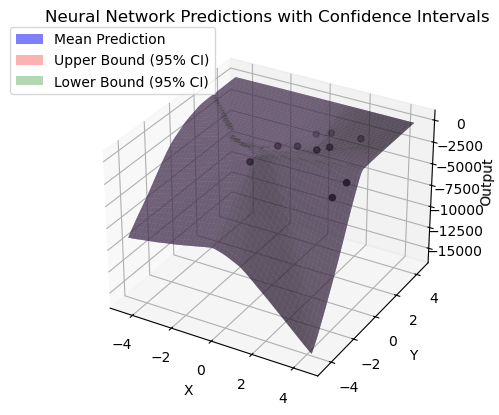

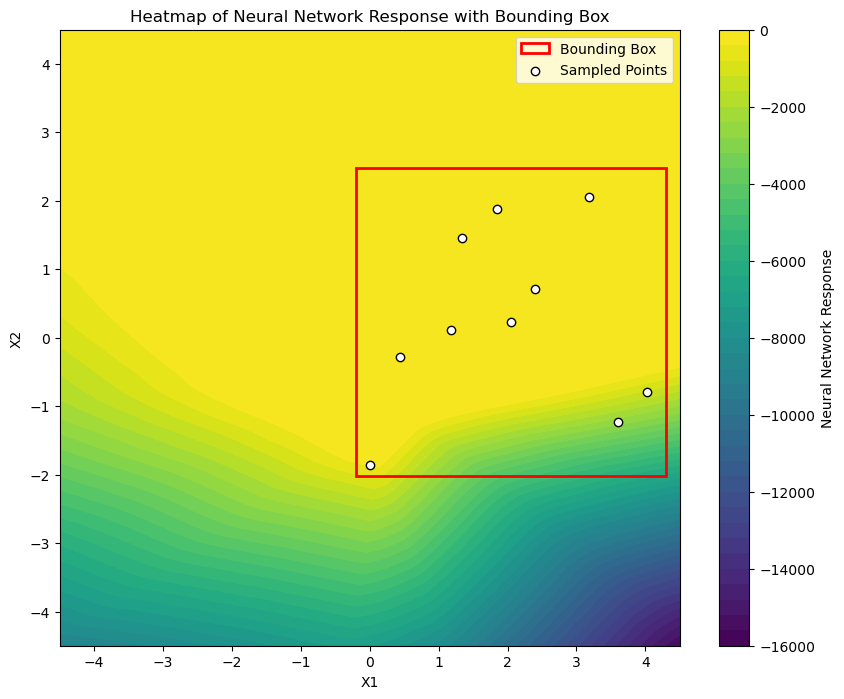

NameError: name 'bo' is not defined

In [ ]:
df_sim, df_new5 = perform_iteration(df_sim, df)

Best hyperparameters:
num_layers: 2
num_units: 200
learning_rate: 0.03243387214948518
dropout_rate: 0.0
batch_size: 150
epochs: 126
Epoch 1/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 986ms/step - loss: 10775773.0000
Epoch 2/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 10759524.0000
Epoch 3/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 10722569.0000
Epoch 4/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 10648705.0000
Epoch 5/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - loss: 10524683.0000
Epoch 6/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 10335456.0000
Epoch 7/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 10066318.0000
Epoch 8/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 9704253.0000
Epoch 9/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 9239169.0000
Epoch 10/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 8670352.0000
Epoch 11/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 8013746.5000
Epoch 12/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - loss: 7314226.5000
Epoch

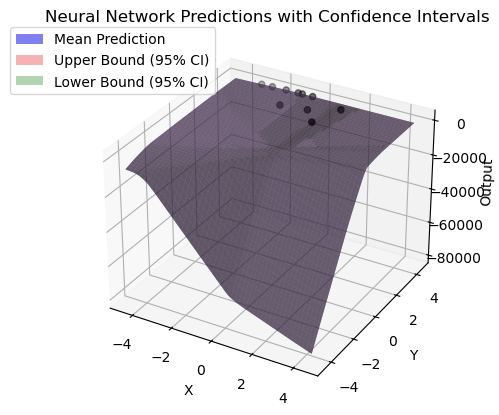

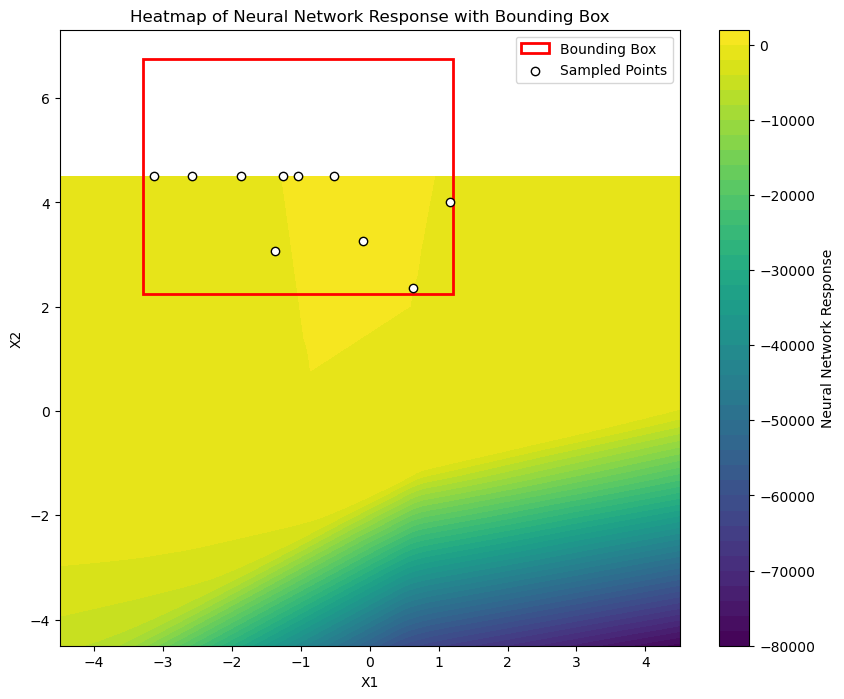

In [ ]:
df_sim, df_new5 = perform_iteration(df_sim, df)

Best hyperparameters:
num_layers: 8
num_units: 178
learning_rate: 0.001798235824053712
dropout_rate: 0.0
batch_size: 28
epochs: 200
Epoch 1/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step - loss: 249446544.0000
Epoch 2/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 249444832.0000
Epoch 3/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 249441552.0000
Epoch 4/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 249435184.0000
Epoch 5/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 249423184.0000
Epoch 6/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 249401456.0000
Epoch 7/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 249363008.0000
Epoch 8/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 249296080.0000
Epoch 9/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 249181840.0000
Epoch 10/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 248990608.0000
Epoch 11/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - loss: 248675184.0000
Epoch 12/200
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 248161

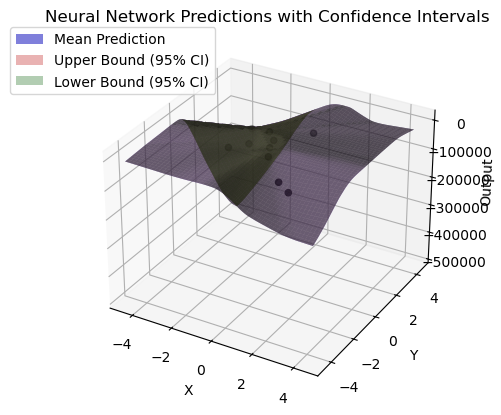

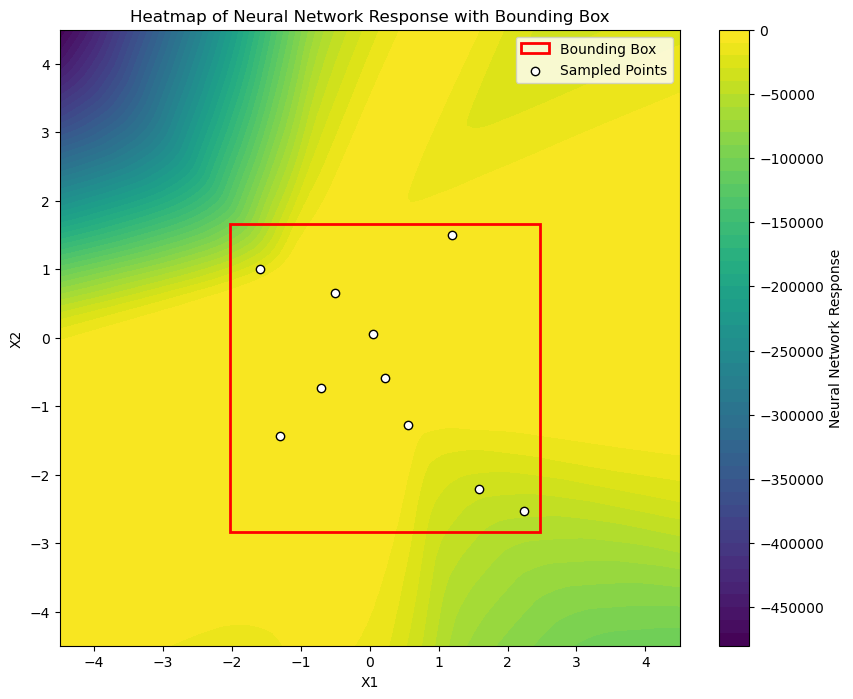

In [ ]:
df_sim, df_new5 = perform_iteration(df_sim, df)

In [ ]:
df_sim, df_new5 = perform_iteration(df_sim, df)

In [ ]:
df_sim, df_new5 = perform_iteration(df_sim, df)

In [ ]:
df_sim, df_new5 = perform_iteration(df_sim, df)

In [ ]:
df_sim, df_new5 = perform_iteration(df_sim, df)

In [ ]:
df_sim, df_new5 = perform_iteration(df_sim, df)

In [ ]:
df_sim, df_new5 = perform_iteration(df_sim, df)

In [ ]:
df_sim, df_new5 = perform_iteration(df_sim, df)

In [ ]:
round_val_df = pd.read_excel("ENN_round.xlsx")

In [ ]:
round_val_df

,Highest_phy_Response,Round_num
0,-64.660164,0
1,-5.021471,1
2,-2.845895,2
3,-1.658476,3
4,-2.735803,4


In [ ]:
new_entry1 = pd.DataFrame({"Highest_phy_Response": [df_new5['z'].max()],
                          "Round_num": [4]})
round_val_df = pd.concat([round_val_df, new_entry1], ignore_index=True)

In [ ]:
df = pd.concat([df, df_new5], ignore_index=True)